# Part B. Age range and Gender, City of Edmonton

## B1. Import libaries

In [1]:
#!conda install pandas --yes

In [2]:
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
import requests 
#from bs4 import BeautifulSoup
#import html5lib

In [3]:
import itertools

import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter

import matplotlib.ticker as ticker
from sklearn import preprocessing
%matplotlib inline
# notice: installing seaborn might takes a few minutes
!conda install -c anaconda seaborn -y
import seaborn as sns

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - seaborn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2020.6.24  |                0         133 KB  anaconda
    certifi-2020.6.20          |           py36_0         160 KB  anaconda
    ------------------------------------------------------------
                                           Total:         292 KB

The following packages will be SUPERSEDED by a higher-priority channel:

  ca-certificates                                 pkgs/main --> anaconda
  certifi                                         pkgs/main --> anaconda
  openssl            conda-forge::openssl-1.1.1g-h516909a_1 --> anaconda::openssl-1.1.1g-h7b6447c_0



ca-certificates-2020 | 133 KB    | ##################################### | 100% 
certifi-2020.6.20    | 1

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.11.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - geopy


The following packages will be UPDATED:

  openssl               anaconda::openssl-1.1.1g-h7b6447c_0 --> conda-forge::openssl-1.1.1g-h516909a_1

The following packages will be SUPERSEDED by a higher-priority channel:

  ca-certificates     anaconda::ca-certificates-2020.6.24-0 --> conda-forge::ca-certificates-2020.6.20-hecda079_0
  certifi                anaconda::certifi-2020.6.20-py36_0 --> conda-forge::certifi-2020.6.20-py36h9f0ad1d_0


Preparing transaction: done
Verifying transaction: done
Executing transaction: done
Solving environment: done

# All requested packages already installed.

Libraries imported.


In [5]:
!pip install geocoder #get latitude and longtitude if know address/postalcode

!conda install -c districtdatalabs yellowbrick --yes #for kmean

!pip install lxml

!pip install BeautifulSoup4
from bs4 import BeautifulSoup

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - yellowbrick


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2020.6.24  |                0         125 KB
    certifi-2020.6.20          |           py36_0         156 KB
    ------------------------------------------------------------
                                           Total:         281 KB

The following packages will be UPDATED:

  ca-certificates    conda-forge::ca-certificates-2020.6.2~ --> pkgs/main::ca-certificates-2020.6.24-0

The following packages will be SUPERSEDED by a higher-priority channel:

  certifi            conda-forge::certifi-2020.6.20-py36h9~ --> pkgs/main::certifi-2020.6.20-py36_0



ca-certificates-2020 | 125 KB    | ##################################### | 100% 
certifi-2020.6.20    | 156 KB    | ######

## B-import dataframes from other notebook

Import mature, established, developing Neighbourhood and their classification ID

In [6]:
%store -r dclassMED
dclassMED.tail()

,Neighbourhood,Classification
284,Windermere,1
285,Windermere Area,1
286,Windsor Park,4
287,Woodcroft,4
288,York,4


## B-2019

### B-2019.1 Import data

Reference:    
 - https://data.edmonton.ca/Census/2019-Census-Age-Range-and-Gender-Report-Ward-/ccp5-inyd (2019 Census - Age Range and Gender) (Ward)

In [7]:
df_2019 = pd.read_csv("https://data.edmonton.ca/api/views/ccp5-inyd/rows.csv?accessType=DOWNLOAD")
df_2019.head()

,Ward,Age range,Man/boy,Woman/girl,Trans Man (FtM),Trans Woman (MtF),Two-Spirit,Non-binary,Identified as another gender,Prefer Not to Answer
0,Ward 1,0-4,1964,1864,0,0,0,0,0,40
1,Ward 1,5-9,2193,2142,0,0,0,3,1,31
2,Ward 1,10-14,1961,1960,0,0,0,5,0,17
3,Ward 1,15-19,1903,1857,3,6,1,4,0,29
4,Ward 1,20-24,1902,1840,1,1,2,4,1,23


### B-2019.2 Clean data

In [8]:
df_2019c=df_2019.copy()
df_2019c = df_2019c.groupby('Age range',axis=0)['Man/boy','Woman/girl'].sum().reset_index()
df_2019c

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,Age range,Man/boy,Woman/girl
0,0-4,23642,22812
1,10-14,25364,24220
2,15-19,22984,21811
3,20-24,27630,27121
4,25-29,31987,32605
5,30-34,36357,37095
6,35-39,35555,35713
7,40-44,30478,30377
8,45-49,27152,26527
9,5-9,27576,26108


In [9]:
!pip install natsort

In [10]:
from natsort import index_natsorted, order_by_index
df_2019c = df_2019c.reindex(index=order_by_index(df_2019c.index, index_natsorted(df_2019c['Age range'], reverse=False)))

In [11]:
df_2019c

,Age range,Man/boy,Woman/girl
0,0-4,23642,22812
9,5-9,27576,26108
1,10-14,25364,24220
2,15-19,22984,21811
3,20-24,27630,27121
4,25-29,31987,32605
5,30-34,36357,37095
6,35-39,35555,35713
7,40-44,30478,30377
8,45-49,27152,26527


#### B-2019.2.1 Total population - Male, Female, Total population

In [12]:
TP_2019M=df_2019c['Man/boy'].sum()
TP_2019M

434426

In [13]:
TP_2019F=df_2019c['Woman/girl'].sum()
TP_2019F

441545

In [14]:
TP_2019T=df_2019.copy()
cols_to_sum = TP_2019T.columns[ 2 : TP_2019T.shape[1]]
print(cols_to_sum)

Index(['Man/boy', 'Woman/girl', 'Trans Man (FtM)', 'Trans Woman (MtF)',
       'Two-Spirit', 'Non-binary', 'Identified as another gender',
       'Prefer Not to Answer'],
      dtype='object')


In [15]:

TP_2019T['Total'] = TP_2019T[cols_to_sum].sum(axis=1)
TP_2019T.tail(2)

,Ward,Age range,Man/boy,Woman/girl,Trans Man (FtM),Trans Woman (MtF),Two-Spirit,Non-binary,Identified as another gender,Prefer Not to Answer,Total
226,Ward 12,85+,163,202,0,0,0,0,0,8,373
227,Ward 12,Prefer Not to Answer,2547,2540,2,3,1,0,3,7897,12993


In [16]:
TP_2019TT=TP_2019T['Total'].sum()
TP_2019TT

972223

#### B-2019.2.2 Gender in each age

In [17]:
df_2019c=df_2019c[df_2019c['Age range']!='Prefer Not to Answer']
df_2019c.reset_index(drop=True, inplace=True)
df_2019c

,Age range,Man/boy,Woman/girl
0,0-4,23642,22812
1,5-9,27576,26108
2,10-14,25364,24220
3,15-19,22984,21811
4,20-24,27630,27121
5,25-29,31987,32605
6,30-34,36357,37095
7,35-39,35555,35713
8,40-44,30478,30377
9,45-49,27152,26527


#### B-2019.2.3 Median and mean age-range in 2019

Mean for Male Population

In [18]:
bins=np.arange(0, 86, 5)+2
print(bins)

[ 2  7 12 17 22 27 32 37 42 47 52 57 62 67 72 77 82 87]


In [19]:
age2019M=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2019c['Man/boy'][i]
    age2019M.extend(a)
age2019M= np.array(age2019M)

stdage2019M=age2019M.copy()
median2019M=age2019M.copy()

age2019M=age2019M.mean()
print(age2019M)

37.23629982403333


Medium for Male Population

In [20]:
from statistics import median 
mid2019M=median(median2019M)
print(mid2019M)

37


Mean for Female Population

In [21]:
age2019F=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2019c['Woman/girl'][i]
    age2019F.extend(a)
age2019F= np.array(age2019F)

stdage2019F=age2019F.copy()
median2019F=age2019F.copy()

age2019F=age2019F.mean()
print(age2019F)

38.43435525614676


Medium for Female Population

In [22]:
mid2019F=median(median2019F)
print(mid2019F)

37.0


#### B-2019.2.4 Standard diviation for each gender population (Q1 and Q3)

Here I use population standard deviation.
Note: numpy uses population standard deviation by default, which is similar to pstdev of statistics module.(https://honingds.com/blog/python-standard-deviation/)

Male Std, Q1, Q3

Population standard diviation:

In [23]:
std2019M=np.std(stdage2019M)
print(std2019M)

21.589169560889967


Q1

In [24]:
Q1M2019=age2019M-std2019M
print(Q1M2019)

15.647130263143364


Q2

In [25]:
Q3M2019=age2019M+std2019M
print(Q3M2019)

58.825469384923295


Female Std, Q1, Q3

In [26]:
std2019F=np.std(stdage2019F)
print(std2019F)

22.039018247446045


Q1

In [27]:
Q1F2019=age2019F-std2019F
print(Q1F2019)

16.395337008700714


Q2

In [28]:
Q3F2019=age2019F+std2019F
print(Q3F2019)

60.4733735035928


#### B-2019.2.5 Mode age-range in 2019

Male Mode

In [29]:
mr2019M= df_2019c['Man/boy'].argmax()

In [30]:
m2019M=df_2019c['Age range'][mr2019M-1]
print(m2019M)

25-29


In [31]:
#m2019M=m2019M.replace('-', '')
m2019M=int(m2019M[:2])+2
print(m2019M)

27


Female Mode

In [32]:
mr2019F= df_2019c['Woman/girl'].argmax()

In [33]:
m2019F=df_2019c['Age range'][mr2019F-1]

In [34]:
m2019F=int(m2019F[:2])+2
print(m2019F)

27


### B-2019.3 Total population of each Neighbourhood

Reference:    
 - https://data.edmonton.ca/Census/2019-Census-Population-by-Age-Range-Neighbourhood-/a6zx-dzqn 2019 Census - Population by Age Range

Import data

In [35]:
dN_2019 = pd.read_csv("https://data.edmonton.ca/api/views/a6zx-dzqn/rows.csv?accessType=DOWNLOAD")
dN_2019.tail()

,Ward,Neighbourhood Number,Neighbourhood Name,Age Range,Population
7576,Ward 9,5468,Graydon Hill,60-64,13
7577,Ward 1,4510,Stone Industrial,65-69,0
7578,Ward 1,4474,Starling,50-54,70
7579,Ward 7,1120,Edmonton Northlands,55-59,0
7580,Ward 4,2390,Kernohan,45-49,141


Clean data

In [36]:
dN_2019n=dN_2019.copy()
dN_2019n = dN_2019n.groupby('Neighbourhood Name',axis=0)['Population'].sum().reset_index()
dN_2019n.rename(columns={'Population':'2019Total','Neighbourhood Name':'Neighbourhood'}, inplace=True)
dN_2019n.tail()

,Neighbourhood,2019Total
394,Woodcroft,2603
395,Yellowhead Corridor East,0
396,Yellowhead Corridor West,0
397,York,3917
398,Youngstown Industrial,0


In [37]:
len(dN_2019n)

399

In [38]:
dN_2019n2=dN_2019n.copy()
dN_2019n2['Year']=[2019]*len(dN_2019n)
dN_2019n2.rename(columns={'2019Total':'Total'}, inplace=True)
dN_2019n2.tail()

,Neighbourhood,Total,Year
394,Woodcroft,2603,2019
395,Yellowhead Corridor East,0,2019
396,Yellowhead Corridor West,0,2019
397,York,3917,2019
398,Youngstown Industrial,0,2019


### B-2019.4 Total population of each Ward

Reference:    
 - https://data.edmonton.ca/Census/2019-Census-Population-by-Age-Range-Neighbourhood-/a6zx-dzqn 2019 Census - Population by Age Range

Import data

In [39]:
dW_2019 = pd.read_csv("https://data.edmonton.ca/api/views/a6zx-dzqn/rows.csv?accessType=DOWNLOAD")
dW_2019.tail()

,Ward,Neighbourhood Number,Neighbourhood Name,Age Range,Population
7576,Ward 9,5468,Graydon Hill,60-64,13
7577,Ward 1,4510,Stone Industrial,65-69,0
7578,Ward 1,4474,Starling,50-54,70
7579,Ward 7,1120,Edmonton Northlands,55-59,0
7580,Ward 4,2390,Kernohan,45-49,141


Clean data

In [40]:
dW_2019w=dW_2019.copy()
dW_2019w = dW_2019w.groupby('Ward',axis=0)['Population'].sum().reset_index()
dW_2019w.rename(columns={'Population':'Total'}, inplace=True)
dW_2019w

,Ward,Total
0,Ward 1,79170
1,Ward 10,83693
2,Ward 11,71658
3,Ward 12,111537
4,Ward 2,80786
5,Ward 3,76674
6,Ward 4,84951
7,Ward 5,77447
8,Ward 6,72819
9,Ward 7,63211


In [41]:
dW_2019w['Ward'] = dW_2019w['Ward'].str[4::]
dW_2019w['Ward'] = dW_2019w['Ward'].str.replace(' ', '')
dW_2019w['Ward'] = dW_2019w['Ward'].str.zfill(2)
dW_2019w['Ward'] = 'WARD ' + dW_2019w['Ward'].astype(str)
dW_2019w

,Ward,Total
0,WARD 01,79170
1,WARD 10,83693
2,WARD 11,71658
3,WARD 12,111537
4,WARD 02,80786
5,WARD 03,76674
6,WARD 04,84951
7,WARD 05,77447
8,WARD 06,72819
9,WARD 07,63211


In [42]:
dW_2019w = dW_2019w.reindex(index=order_by_index(dW_2019w.index, index_natsorted(dW_2019w['Ward'], reverse=False)))
dW_2019w

,Ward,Total
0,WARD 01,79170
4,WARD 02,80786
5,WARD 03,76674
6,WARD 04,84951
7,WARD 05,77447
8,WARD 06,72819
9,WARD 07,63211
10,WARD 08,63348
11,WARD 09,106667
1,WARD 10,83693


### B-2019 Heat map Population in each Neighbourhood over the past 10 yrs (mature/established/developing neighbourhoods)

Get the geographical coordinates for each borough in Edmonton

In [43]:
address = 'Edmonton, AB'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Edmonton are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Edmonton are 53.535411, -113.507996.


Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [44]:
!pip install geopandas

In [45]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [46]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                dN_2019n2[['Neighbourhood','Total']],
                 on='Neighbourhood')
NeiAmerge = pd.merge(NeiAmerge,
                dclassMED[['Neighbourhood','Classification']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Total,Classification
283,"MULTIPOLYGON (((-113.38192 53.58676, -113.3821...",0.891282105009076,Kernohan,2390,3148,2
284,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,1506,1
285,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,4046,4
286,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,868,5
287,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,3813,2


In [47]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.YlOrRd_09.scale(0, dN_2019n2['Total'].max())#.to_step(len(NeiAmerge)) 
colormap

In [48]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')
colormap.caption = "Numbers of people"

style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Total']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Total'],
        aliases=['Neighbourhood','Total Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)
edmA_map

## B-2016

### B-2016.1 Import data

Reference:    
2016 Census - Population by Single Year of Age and Gender    
 - https://data.edmonton.ca/Census/2016-Census-Population-by-Single-Year-of-Age-and-G/7r3v-fetr (Neighbourhood) 
 - https://data.edmonton.ca/Census/2016-Census-Population-by-Single-Year-of-Age-and-G/67ng-8u4y (Ward)
 - https://data.edmonton.ca/Census/2016-Census-Population-by-Single-Year-of-Age-and-G/6gcq-27m9 (citywide)

In [49]:
df_2016 = pd.read_csv("https://data.edmonton.ca/api/views/6gcq-27m9/rows.csv?accessType=DOWNLOAD")
df_2016.tail()

,Age,Female,Male,Other
82,82,1322,946,1
83,83,1297,913,2
84,84,1155,867,1
85,85+,8006,4501,3
86,No response,106065,112625,880


In [50]:
df_2016.rename(columns={'Female':'Woman/girl', 'Male':'Man/boy'}, inplace=True)
df_2016.head(3)

,Age,Woman/girl,Man/boy,Other
0,0,4124,3621,6
1,1,3877,3630,6
2,2,4304,3985,5


### B-2016.2 Clean data

In [51]:
bins=np.arange(0, 86, 5)
print(bins)

[ 0  5 10 15 20 25 30 35 40 45 50 55 60 65 70 75 80 85]


In [52]:
labels=[]
for i in range(len(bins)-1):
    labels.append(str(bins[i])+'-'+str(bins[i+1]-1))

print(labels)

['0-4', '5-9', '10-14', '15-19', '20-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', '80-84']


In [53]:
df_2016c=df_2016.copy()

#df_2016c.rename(columns={'Female':'Woman/girl', 'Male':'Man/boy'}, inplace=True)
#columns_titles = ["Age range","Man/boy","Woman/girl"]
#df_2016c=df_2016c.reindex(columns=columns_titles)

df_2016c=df_2016c[df_2016c['Age']!='85+']
df_2016c=df_2016c[df_2016c['Age']!='No response']
df_2016c['Age']=pd.to_numeric(df_2016c['Age'])

bins = np.arange(0, 86, 5)
labels=[]
for i in range(len(bins)-1):
    labels.append(str(bins[i])+'-'+str(bins[i+1]-1))
df_2016c['Age range'] = pd.cut(df_2016c.Age, bins, labels = labels,include_lowest = True)



df_2016c.tail()

,Age,Woman/girl,Man/boy,Other,Age range
80,80,1477,1148,0,75-79
81,81,1370,1015,2,80-84
82,82,1322,946,1,80-84
83,83,1297,913,2,80-84
84,84,1155,867,1,80-84


#### B-2016.2.1 Total population - Male, Female, Total population

In [54]:
TP_2016M=df_2016.copy()
TP_2016M=TP_2016M['Man/boy'].sum()
TP_2016M

434763

In [55]:
TP_2016F=df_2016.copy()
TP_2016F=TP_2016F['Woman/girl'].sum()
TP_2016F

463472

In [56]:
TP_2016T=df_2016.copy()
cols_to_sum = TP_2016T.columns[ 1 : TP_2016T.shape[1]]
print(cols_to_sum)

Index(['Woman/girl', 'Man/boy', 'Other'], dtype='object')


In [57]:
TP_2016T['Total'] = TP_2016T[cols_to_sum].sum(axis=1)
TP_2016T.tail(2)

,Age,Woman/girl,Man/boy,Other,Total
85,85+,8006,4501,3,12510
86,No response,106065,112625,880,219570


In [58]:
TP_2016TT=TP_2016T['Total'].sum()
TP_2016TT

899447

#### B-2016.2.2 Gender in each age

In [59]:
df_2016c = df_2016c.groupby('Age range',axis=0)['Man/boy','Woman/girl'].sum().reset_index()

df_2016c85=df_2016.copy()
df_2016c85=df_2016c85[df_2016c85['Age']=='85+']
df_2016c85.rename(columns={'Age':'Age range'}, inplace=True)
df_2016c85.drop(["Other"],axis=1, inplace=True)
df_2016c = df_2016c.append(df_2016c85, ignore_index=True)
df_2016c

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,Age range,Man/boy,Woman/girl
0,0-4,23393,25226
1,5-9,19540,20569
2,10-14,16990,17751
3,15-19,18465,19165
4,20-24,23146,24758
5,25-29,27000,29275
6,30-34,27146,30054
7,35-39,24496,26075
8,40-44,21860,23219
9,45-49,20743,22115


#### B-2016.2.3 Median and mean age-range in 2016

Mean for Male Population

In [60]:
bins=np.arange(0, 86, 5)+2
print(bins)

[ 2  7 12 17 22 27 32 37 42 47 52 57 62 67 72 77 82 87]


In [61]:
age2016M=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2016c['Man/boy'][i]
    age2016M.extend(a)
age2016M= np.array(age2016M)

stdage2016M=age2016M.copy()
median2016M=age2016M.copy()

age2016M=age2016M.mean()
print(age2016M)

36.903240226238445


Medium for Male Population

In [62]:
mid2016M=median(median2016M)
print(mid2016M)

37.0


Mean for Female Population

In [63]:
age2016F=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2016c['Woman/girl'][i]
    age2016F.extend(a)
age2016F= np.array(age2016F)

stdage2016F=age2016F.copy()
median2016F=age2016F.copy()

age2016F=age2016F.mean()
print(age2016F)

38.25520764842322


Medium for Female Population

In [64]:
mid2016F=median(median2016F)
print(mid2016F)

37


#### B-2016.2.4 Standard diviation for each gender population (Q1 and Q3)

Here I use population standard deviation.
Note: numpy uses population standard deviation by default, which is similar to pstdev of statistics module.(https://honingds.com/blog/python-standard-deviation/)

Male Std, Q1, Q3

Population standard diviation:

In [65]:
std2016M=np.std(stdage2016M)
print(std2016M)

21.82378309070987


Q1

In [66]:
Q1M2016=age2016M-std2016M
print(Q1M2016)

15.079457135528575


Q2

In [67]:
Q3M2016=age2016M+std2016M
print(Q3M2016)

58.72702331694832


Female Std, Q1, Q3

In [68]:
std2016F=np.std(stdage2016F)
print(std2016F)

22.541454811420287


Q1

In [69]:
Q1F2016=age2016F-std2016F
print(Q1F2016)

15.713752837002936


Q2

In [70]:
Q3F2016=age2016F+std2016F
print(Q3F2016)

60.79666245984351


#### B-2016.2.5 Mode age-range in 2016

Male Mode

In [71]:
mr2016M= df_2016c['Man/boy'].argmax()

In [72]:
m2016M=df_2016c['Age range'][mr2016M-1]

In [73]:
#m2019M=m2019M.replace('-', '')
m2016M=int(m2016M[:2])+2
print(m2016M)

27


Female Mode

In [74]:
mr2016F= df_2016c['Woman/girl'].argmax()

In [75]:
m2016F=df_2016c['Age range'][mr2016F-1]

In [76]:
#m2019M=m2019M.replace('-', '')
m2016F=int(m2016F[:2])+2
print(m2016F)

27


### B-2016.3 Total population of each Neighbourhood

Reference:    
 - https://data.edmonton.ca/Census/2016-Census-Population-by-Single-Year-of-Age-and-G/7r3v-fetr 2016 Census - Population by Single Year of Age and Gender (Neighbourhood/Ward)

Import data

In [77]:
dN_2016 = pd.read_csv("https://data.edmonton.ca/api/views/7r3v-fetr/rows.csv?accessType=DOWNLOAD")
dN_2016.head()

,Ward,Neighbourhood Number,Neighbourhood Name,Age,Female,Male,Other
0,WARD 1,3140,CRESTWOOD,0,8,8,0
1,WARD 1,3140,CRESTWOOD,1,11,2,0
2,WARD 1,3140,CRESTWOOD,2,9,4,0
3,WARD 1,3140,CRESTWOOD,3,7,6,0
4,WARD 1,3140,CRESTWOOD,4,10,3,0


Clean data

In [78]:
dN_2016n=dN_2016.copy()
dN_2016n = dN_2016n.groupby('Neighbourhood Name',axis=0)['Female','Male','Other'].sum().reset_index()
dN_2016n.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
dN_2016n['Neighbourhood']=dN_2016n['Neighbourhood'].str.title()

dN_2016n.tail()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,Neighbourhood,Female,Male,Other
383,Woodcroft,1182,961,1
384,Yellowhead Corridor East,0,0,0
385,Yellowhead Corridor West,0,0,0
386,York,2025,1876,0
387,Youngstown Industrial,0,0,0


In [79]:
cols_to_sum = dN_2016n.columns[ 1 : dN_2016n.shape[1]]
dN_2016n['Total'] = dN_2016n[cols_to_sum].sum(axis=1)
dN_2016n.tail()

,Neighbourhood,Female,Male,Other,Total
383,Woodcroft,1182,961,1,2144
384,Yellowhead Corridor East,0,0,0,0
385,Yellowhead Corridor West,0,0,0,0
386,York,2025,1876,0,3901
387,Youngstown Industrial,0,0,0,0


In [80]:
dN_2016n1=dN_2016n.copy()
dN_2016n1.rename(columns={'Total':'2016Total'}, inplace=True)
dN_2016n1.drop(["Female","Male","Other"],axis=1, inplace=True)
dN_2016n1.tail()

,Neighbourhood,2016Total
383,Woodcroft,2144
384,Yellowhead Corridor East,0
385,Yellowhead Corridor West,0
386,York,3901
387,Youngstown Industrial,0


In [81]:
dN_2016n2=dN_2016n1.copy()
dN_2016n2['Year']=[2016]*len(dN_2016n1)
dN_2016n2.rename(columns={'2016Total':'Total'}, inplace=True)
dN_2016n2.tail()

,Neighbourhood,Total,Year
383,Woodcroft,2144,2016
384,Yellowhead Corridor East,0,2016
385,Yellowhead Corridor West,0,2016
386,York,3901,2016
387,Youngstown Industrial,0,2016


### !!!!!!Store dN_2016n2: Core, Mature, Established, Developing Neighbourhoods with ≥10 Millennials per net residential hectare

In [82]:
%store dN_2016n2

Stored 'dN_2016n2' (DataFrame)


### B-2016 Heat map Population in each Neighbourhood over the past 10 yrs (mature/established/developing neighbourhoods)

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [83]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [84]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                dN_2016n2[['Neighbourhood','Total']],
                 on='Neighbourhood')
NeiAmerge = pd.merge(NeiAmerge,
                dclassMED[['Neighbourhood','Classification']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Total,Classification
264,"MULTIPOLYGON (((-113.38192 53.58676, -113.3821...",0.891282105009076,Kernohan,2390,2992,2
265,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,1431,1
266,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,4004,4
267,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,915,5
268,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,3369,2


In [85]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.Paired_10.scale(0, dN_2019n2['Total'].max())#.to_step(len(NeiAmerge)) 
colormap

In [86]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')
colormap.caption = "Numbers of people"

style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Total']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Total'],
        aliases=['Neighbourhood','Total Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

## B-2014

### B-2014.1 Import data

Reference:    
2014 Census - Population by Single Year of Age and Gender    
 - https://data.edmonton.ca/Census/2014-Census-Population-By-Single-Year-Of-Age-And-G/44iw-gmaw (Neighbour&Ward)
 - https://data.edmonton.ca/Census/2014-Census-Population-By-Single-Year-Of-Age-And-G/brcm-i74d (Wards)
 - https://data.edmonton.ca/Census/2014-Census-Population-By-Single-Year-Of-Age-And-G/xcqe-tyzj (Citywide)

In [87]:
df_2014 = pd.read_csv("https://data.edmonton.ca/api/views/xcqe-tyzj/rows.csv?accessType=DOWNLOAD")
df_2014.head()

,AGE,FEMALE,MALE
0,0,4142,4435
1,1,4378,4514
2,2,4236,4558
3,3,4417,4553
4,4,4386,4608


In [88]:
df_2014.rename(columns={'FEMALE':'Woman/girl', 'MALE':'Man/boy'}, inplace=True)
df_2014.head(3)

,AGE,Woman/girl,Man/boy
0,0,4142,4435
1,1,4378,4514
2,2,4236,4558


### B-2014.2 Clean data

In [89]:
bins=np.arange(0, 86, 5)
print(bins)

[ 0  5 10 15 20 25 30 35 40 45 50 55 60 65 70 75 80 85]


In [90]:
labels=[]
for i in range(len(bins)-1):
    labels.append(str(bins[i])+'-'+str(bins[i+1]-1))

print(labels)

['0-4', '5-9', '10-14', '15-19', '20-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', '80-84']


In [91]:
df_2014c=df_2014.copy()

df_2014c=df_2014c[df_2014c['AGE']!='85+']
df_2014c=df_2014c[df_2014c['AGE']!='No Response']
df_2014c['AGE']=pd.to_numeric(df_2014c['AGE'])

bins = np.arange(0, 86, 5)
labels=[]
for i in range(len(bins)-1):
    labels.append(str(bins[i])+'-'+str(bins[i+1]-1))
df_2014c['Age range'] = pd.cut(df_2014c.AGE, bins, labels = labels,include_lowest = True)

df_2014c.head()

,AGE,Woman/girl,Man/boy,Age range
0,0,4142,4435,0-4
1,1,4378,4514,0-4
2,2,4236,4558,0-4
3,3,4417,4553,0-4
4,4,4386,4608,0-4


#### B-2014.2.1 Total population - Male, Female, Total population

In [92]:
TP_2014M=df_2014.copy()
TP_2014M=TP_2014M['Man/boy'].sum()
TP_2014M

442008

In [93]:
TP_2014F=df_2014.copy()
TP_2014F=TP_2014F['Woman/girl'].sum()
TP_2014F

433642

In [94]:
TP_2014T=df_2014.copy()
cols_to_sum = TP_2014T.columns[ 1 : TP_2014T.shape[1]]
print(cols_to_sum)

Index(['Woman/girl', 'Man/boy'], dtype='object')


In [95]:
TP_2014T['Total'] = TP_2014T[cols_to_sum].sum(axis=1)
TP_2014T.tail(2)

,AGE,Woman/girl,Man/boy,Total
85,85+,7713,4537,12250
86,No Response,71938,81885,153823


In [96]:
TP_2014TT=TP_2014T['Total'].sum()
TP_2014TT

875650

#### B-2014.2.2 Gender in each age

In [97]:
df_2014c = df_2014c.groupby('Age range',axis=0)['Man/boy','Woman/girl'].sum().reset_index()

df_2014c85=df_2014.copy()
df_2014c85=df_2014c85[df_2014c85['AGE']=='85+']
df_2014c85.rename(columns={'AGE':'Age range'}, inplace=True)
#df_2014c85.drop(["Other"],axis=1, inplace=True)
df_2014c = df_2014c.append(df_2014c85, ignore_index=True)
df_2014c

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,Age range,Man/boy,Woman/girl
0,0-4,27078,25933
1,5-9,20614,19719
2,10-14,19527,18676
3,15-19,22151,21065
4,20-24,28887,27770
5,25-29,32019,31159
6,30-34,30307,29679
7,35-39,26614,25513
8,40-44,24961,23965
9,45-49,24628,24272


#### B-2014.2.3 Median and mean age-range in 2014

Mean for Male Population

In [98]:
bins=np.arange(0, 86, 5)+2
print(bins)

[ 2  7 12 17 22 27 32 37 42 47 52 57 62 67 72 77 82 87]


In [99]:
age2014M=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2014c['Man/boy'][i]
    age2014M.extend(a)
age2014M= np.array(age2014M)

stdage2014M=age2014M.copy()
median2014M=age2014M.copy()

age2014M=age2014M.mean()
print(age2014M)

35.97862674697256


Medium for Male Population

In [100]:
from statistics import median 
mid2014M=median(median2014M)
print(mid2014M)

32


Mean for Female Population

In [101]:
age2014F=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2014c['Woman/girl'][i]
    age2014F.extend(a)
age2014F= np.array(age2014F)

stdage2014F=age2014F.copy()
median2014F=age2014F.copy()

age2014F=age2014F.mean()
print(age2014F)

37.50844060336629


Medium for Female Population

In [102]:
mid2014F=median(median2014F)
print(mid2014F)

37.0


#### B-2014.2.4 Standard diviation for each gender population (Q1 and Q3)

Here I use population standard deviation.
Note: numpy uses population standard deviation by default, which is similar to pstdev of statistics module.(https://honingds.com/blog/python-standard-deviation/)

Male Std, Q1, Q3

Population standard diviation:

In [103]:
std2014M=np.std(stdage2014M)
print(std2014M)

21.398221549423578


Q1

In [104]:
Q1M2014=age2014M-std2014M
print(Q1M2014)

14.58040519754898


Q2

In [105]:
Q3M2014=age2014M+std2014M
print(Q3M2014)

57.37684829639613


Female Std, Q1, Q3

In [106]:
std2014F=np.std(stdage2014F)
print(std2014F)

22.263122744793435


Q1

In [107]:
Q1F2014=age2014F-std2014F
print(Q1F2014)

15.245317858572854


Q2

In [108]:
Q3F2014=age2014F+std2014F
print(Q3F2014)

59.771563348159724


#### B-2014.2.5 Mode age-range in 2014

Male Mode

In [109]:
mr2014M= df_2014c['Man/boy'].argmax()

In [110]:
m2014M=df_2014c['Age range'][mr2014M-1]

In [111]:
#m2019M=m2019M.replace('-', '')
m2014M=int(m2014M[:2])+2
print(m2014M)

22


Female Mode

In [112]:
mr2014F= df_2014c['Woman/girl'].argmax()

In [113]:
m2014F=df_2014c['Age range'][mr2014F-1]

In [114]:
#m2019M=m2019M.replace('-', '')
m2014F=int(m2014F[:2])+2
print(m2014F)

22


### B-2014.3 Total population of each Neighbourhood

Reference:    
 - https://data.edmonton.ca/Census/2014-Census-Population-By-Single-Year-Of-Age-And-G/44iw-gmaw 2014 Census - Population By Single Year Of Age And Gender (Neighbourhood)

Import data

In [115]:
dN_2014 = pd.read_csv("https://data.edmonton.ca/api/views/44iw-gmaw/rows.csv?accessType=DOWNLOAD")
dN_2014.tail()

,WARD,NEIGHBOURHOOD_NUMBER,NEIGHBOURHOOD_NAME,AGE,FEMALE,MALE
33664,Ward 12,6790,WILD ROSE,82,2,1
33665,Ward 12,6790,WILD ROSE,83,9,7
33666,Ward 12,6790,WILD ROSE,84,3,0
33667,Ward 12,6790,WILD ROSE,85+,19,11
33668,Ward 12,6790,WILD ROSE,No Response,530,525


Clean data

In [116]:
dN_2014n=dN_2014.copy()
dN_2014n = dN_2014n.groupby('NEIGHBOURHOOD_NAME',axis=0)['FEMALE','MALE'].sum().reset_index()
dN_2014n.rename(columns={'NEIGHBOURHOOD_NAME':'Neighbourhood', 'FEMALE':'Female', 'MALE':'Male'}, inplace=True)
dN_2014n['Neighbourhood']=dN_2016n['Neighbourhood'].str.title()

dN_2014n.tail()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,Neighbourhood,Female,Male
381,Winterburn Industrial Area East,1454,1230
382,Winterburn Industrial Area West,0,0
383,Woodcroft,0,0
384,Yellowhead Corridor East,2010,2042
385,Yellowhead Corridor West,0,0


In [117]:
cols_to_sum = dN_2014n.columns[ 1 : dN_2014n.shape[1]]
dN_2014n['Total'] = dN_2014n[cols_to_sum].sum(axis=1)
dN_2014n.tail()

,Neighbourhood,Female,Male,Total
381,Winterburn Industrial Area East,1454,1230,2684
382,Winterburn Industrial Area West,0,0,0
383,Woodcroft,0,0,0
384,Yellowhead Corridor East,2010,2042,4052
385,Yellowhead Corridor West,0,0,0


In [118]:
dN_2014n1=dN_2014n.copy()
dN_2014n1.rename(columns={'Total':'2014Total'}, inplace=True)
dN_2014n1.drop(["Female","Male"],axis=1, inplace=True)
dN_2014n1.tail()

,Neighbourhood,2014Total
381,Winterburn Industrial Area East,2684
382,Winterburn Industrial Area West,0
383,Woodcroft,0
384,Yellowhead Corridor East,4052
385,Yellowhead Corridor West,0


In [119]:
dN_2014n2=dN_2014n1.copy()
dN_2014n2['Year']=[2014]*len(dN_2014n1)
dN_2014n2.rename(columns={'2014Total':'Total'}, inplace=True)
dN_2014n2.tail()

,Neighbourhood,Total,Year
381,Winterburn Industrial Area East,2684,2014
382,Winterburn Industrial Area West,0,2014
383,Woodcroft,0,2014
384,Yellowhead Corridor East,4052,2014
385,Yellowhead Corridor West,0,2014


### B-2014 Heat map Population in each Neighbourhood over the past 10 yrs (mature/established/developing neighbourhoods)

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [120]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [121]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                dN_2014n2[['Neighbourhood','Total']],
                 on='Neighbourhood')
NeiAmerge = pd.merge(NeiAmerge,
                dclassMED[['Neighbourhood','Classification']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Total,Classification
263,"MULTIPOLYGON (((-113.38192 53.58676, -113.3821...",0.891282105009076,Kernohan,2390,2962,2
264,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,70,1
265,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,4173,4
266,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,0,5
267,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,2953,2


In [122]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.Paired_11.scale(0, dN_2014n2['Total'].max())#.to_step(len(NeiAmerge)) 
colormap

In [123]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')

colormap.caption = "Numbers of people"

style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Total']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Total'],
        aliases=['Neighbourhood','Total Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

## B-2012

### B-2012.1 Import data

Reference:    
2012 Census - Population by Single Year of Age and Gender    
 - https://data.edmonton.ca/Census/2012-Census-Population-By-Single-Year-Of-Age-And-G/fqnx-qdsk (Neighbour&Ward)
 - https://data.edmonton.ca/Census/2012-Census-Population-By-Single-Year-Of-Age-And-G/33jk-s9st (Wards)
 - https://data.edmonton.ca/Census/2012-Census-Population-By-Single-Year-Of-Age-And-G/nzgd-btmv (citywide)

In [124]:
df_2012 = pd.read_csv("https://data.edmonton.ca/api/views/nzgd-btmv/rows.csv?accessType=DOWNLOAD")
df_2012.head()

,AGE,FEMALE,MALE
0,0,3729,3954
1,1,4141,4299
2,2,4146,4315
3,3,4172,4198
4,4,4000,4255


In [125]:
df_2012.rename(columns={'FEMALE':'Woman/girl', 'MALE':'Man/boy'}, inplace=True)
df_2012.head(3)

,AGE,Woman/girl,Man/boy
0,0,3729,3954
1,1,4141,4299
2,2,4146,4315


### B-2012.2 Clean data

In [126]:
bins=np.arange(0, 86, 5)
print(bins)

[ 0  5 10 15 20 25 30 35 40 45 50 55 60 65 70 75 80 85]


In [127]:
labels=[]
for i in range(len(bins)-1):
    labels.append(str(bins[i])+'-'+str(bins[i+1]-1))

print(labels)

['0-4', '5-9', '10-14', '15-19', '20-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', '80-84']


In [128]:
df_2012c=df_2012.copy()

df_2012c=df_2012c[df_2012c['AGE']!='85+']
df_2012c=df_2012c[df_2012c['AGE']!='No Response']
df_2012c['AGE']=pd.to_numeric(df_2012c['AGE'])

bins = np.arange(0, 86, 5)
labels=[]
for i in range(len(bins)-1):
    labels.append(str(bins[i])+'-'+str(bins[i+1]-1))
df_2012c['Age range'] = pd.cut(df_2012c.AGE, bins, labels = labels,include_lowest = True)

df_2012c.head()

,AGE,Woman/girl,Man/boy,Age range
0,0,3729,3954,0-4
1,1,4141,4299,0-4
2,2,4146,4315,0-4
3,3,4172,4198,0-4
4,4,4000,4255,0-4


#### B-2012.2.1 Total population - Male, Female, Total population

In [129]:
TP_2012M=df_2012.copy()
TP_2012M=TP_2012M['Man/boy'].sum()
TP_2012M

405763

In [130]:
TP_2012F=df_2012.copy()
TP_2012F=TP_2012F['Woman/girl'].sum()
TP_2012F

398828

In [131]:
TP_2012T=df_2012.copy()
cols_to_sum = TP_2012T.columns[ 1 : TP_2012T.shape[1]]
print(cols_to_sum)

Index(['Woman/girl', 'Man/boy'], dtype='object')


In [132]:
TP_2012T['Total'] = TP_2012T[cols_to_sum].sum(axis=1)
TP_2012T.tail(2)

,AGE,Woman/girl,Man/boy,Total
85,85+,5662,3370,9032
86,No Response,64501,70539,135040


In [133]:
TP_2012TT=TP_2012T['Total'].sum()
TP_2012TT

804591

#### B-2012.2.2 Gender in each age

In [134]:
df_2012c = df_2012c.groupby('Age range',axis=0)['Man/boy','Woman/girl'].sum().reset_index()

df_2012c85=df_2012.copy()
df_2012c85=df_2012c85[df_2012c85['AGE']=='85+']
df_2012c85.rename(columns={'AGE':'Age range'}, inplace=True)
#df_2014c85.drop(["Other"],axis=1, inplace=True)
df_2012c = df_2012c.append(df_2012c85, ignore_index=True)
df_2012c

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,Age range,Man/boy,Woman/girl
0,0-4,25133,24083
1,5-9,18550,17808
2,10-14,18574,17832
3,15-19,21406,21226
4,20-24,28825,27799
5,25-29,30477,29063
6,30-34,27561,26152
7,35-39,24024,23136
8,40-44,23300,22735
9,45-49,24634,24355


#### B-2012.2.3 Median and mean age-range in 2012

Mean for Male Population

In [135]:
bins=np.arange(0, 86, 5)+2
print(bins)

[ 2  7 12 17 22 27 32 37 42 47 52 57 62 67 72 77 82 87]


In [136]:
age2012M=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2012c['Man/boy'][i]
    age2012M.extend(a)
age2012M= np.array(age2012M)

stdage2012M=age2012M.copy()
median2012M=age2012M.copy()

age2012M=age2012M.mean()
print(age2012M)

35.56190189246593


Medium for Male Population

In [137]:
from statistics import median 
mid2012M=median(median2012M)
print(mid2012M)

32.0


Mean for Female Population

In [138]:
age2012F=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2012c['Woman/girl'][i]
    age2012F.extend(a)
age2012F= np.array(age2012F)

stdage2012F=age2012F.copy()
median2012F=age2012F.copy()

age2012F=age2012F.mean()
print(age2012F)

36.82861091087468


Medium for Female Population

In [139]:
#from statistics import median 
mid2012F=median(median2012F)
print(mid2012F)

37


#### B-2012.2.4 Standard diviation for each gender population (Q1 and Q3)

Here I use population standard deviation.
Note: numpy uses population standard deviation by default, which is similar to pstdev of statistics module.(https://honingds.com/blog/python-standard-deviation/)

Male Std, Q1, Q3

Population standard diviation:

In [140]:
std2012M=np.std(stdage2012M)
print(std2012M)

21.10321698769553


Q1

In [141]:
Q1M2012=age2012M-std2012M
print(Q1M2012)

14.458684904770404


Q2

In [142]:
Q3M2012=age2012M+std2012M
print(Q3M2012)

56.66511888016146


Female Std, Q1, Q3

In [143]:
std2012F=np.std(stdage2012F)
print(std2012F)

21.909627188259066


Q1

In [144]:
Q1F2012=age2012F-std2012F
print(Q1F2012)

14.918983722615614


Q2

In [145]:
Q3F2012=age2012F+std2012F
print(Q3F2012)

58.738238099133746


#### B-2012.2.5 Mode age-range in 2012

Male Mode

In [146]:
mr2012M= df_2012c['Man/boy'].argmax()

In [147]:
m2012M=df_2012c['Age range'][mr2012M-1]

In [148]:
#m2019M=m2019M.replace('-', '')
m2012M=int(m2012M[:2])+2
print(m2012M)

22


Female Mode

In [149]:
mr2012F= df_2012c['Woman/girl'].argmax()

In [150]:
m2012F=df_2012c['Age range'][mr2012F-1]

In [151]:
#m2019M=m2019M.replace('-', '')
m2012F=int(m2012F[:2])+2
print(m2012F)

22


### B-2012.3 Total population of each Neighbourhood

Reference:    
 - https://data.edmonton.ca/Census/2012-Census-Population-By-Single-Year-Of-Age-And-G/fqnx-qdsk 2012 Census - Population By Single Year Of Age And Gender (Neighbourhood)

Import data

In [152]:
dN_2012 = pd.read_csv("https://data.edmonton.ca/api/views/fqnx-qdsk/rows.csv?accessType=DOWNLOAD")
dN_2012.tail()

,Ward,NEIGHBOURHOOD_NUMBER,NEIGHBOURHOOD_NAME,AGE,FEMALE,MALE
32620,Ward 12,6790,WILD ROSE,82,4,0
32621,Ward 12,6790,WILD ROSE,83,1,1
32622,Ward 12,6790,WILD ROSE,84,1,1
32623,Ward 12,6790,WILD ROSE,85+,10,8
32624,Ward 12,6790,WILD ROSE,No Response,677,701


Clean data

In [153]:
dN_2012n=dN_2012.copy()
dN_2012n = dN_2012n.groupby('NEIGHBOURHOOD_NAME',axis=0)['FEMALE','MALE'].sum().reset_index()
dN_2012n.rename(columns={'NEIGHBOURHOOD_NAME':'Neighbourhood', 'FEMALE':'Female', 'MALE':'Male'}, inplace=True)
dN_2012n['Neighbourhood']=dN_2012n['Neighbourhood'].str.title()

dN_2012n.tail()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,Neighbourhood,Female,Male
370,Woodcroft,1411,1181
371,Yellowhead Corridor East,0,0
372,Yellowhead Corridor West,0,0
373,York,1885,1940
374,Youngstown Industrial,0,0


In [154]:
cols_to_sum = dN_2012n.columns[ 1 : dN_2012n.shape[1]]
dN_2012n['Total'] = dN_2012n[cols_to_sum].sum(axis=1)
dN_2012n.tail()

,Neighbourhood,Female,Male,Total
370,Woodcroft,1411,1181,2592
371,Yellowhead Corridor East,0,0,0
372,Yellowhead Corridor West,0,0,0
373,York,1885,1940,3825
374,Youngstown Industrial,0,0,0


In [155]:
dN_2012n1=dN_2012n.copy()
dN_2012n1.rename(columns={'Total':'2012Total'}, inplace=True)
dN_2012n1.drop(["Female","Male"],axis=1, inplace=True)
dN_2012n1.tail()

,Neighbourhood,2012Total
370,Woodcroft,2592
371,Yellowhead Corridor East,0
372,Yellowhead Corridor West,0
373,York,3825
374,Youngstown Industrial,0


In [156]:
dN_2012n2=dN_2012n1.copy()
dN_2012n2['Year']=[2012]*len(dN_2012n1)
dN_2012n2.rename(columns={'2012Total':'Total'}, inplace=True)
dN_2012n2.tail()

,Neighbourhood,Total,Year
370,Woodcroft,2592,2012
371,Yellowhead Corridor East,0,2012
372,Yellowhead Corridor West,0,2012
373,York,3825,2012
374,Youngstown Industrial,0,2012


### B-2012 Heat map Population in each Neighbourhood over the past 10 yrs (mature/established/developing neighbourhoods)

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [157]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [158]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                dN_2012n2[['Neighbourhood','Total']],
                 on='Neighbourhood')
NeiAmerge = pd.merge(NeiAmerge,
                dclassMED[['Neighbourhood','Classification']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Total,Classification
251,"MULTIPOLYGON (((-113.38192 53.58676, -113.3821...",0.891282105009076,Kernohan,2390,3066,2
252,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,1466,1
253,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,3994,4
254,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,885,5
255,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,3912,2


In [159]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.Paired_10.scale(0, dN_2019n2['Total'].max())#.to_step(len(NeiAmerge)) 
colormap

In [160]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')

colormap.caption = "Numbers of people"

style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Total']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Total'],
        aliases=['Neighbourhood','Total Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

## B-2011

### B-2011.1 Import data

Reference:    
2011 Census - Population by Single Year of Age and Gender    
 - https://www12.statcan.gc.ca/census-recensement/2011/dp-pd/prof/details/page.cfm?Lang=E&Geo1=CSD&Code1=4811061&Geo2=PR&Code2=48&Data=Count&SearchText=Edmonton&SearchType=Begins&SearchPR=01&B1=All&GeoLevel=PR&GeoCode=4811061    
 - https://www12.statcan.gc.ca/census-recensement/2011/dp-pd/tbt-tt/Rp-eng.cfm?LANG=E&APATH=5&DETAIL=0&DIM=0&FL=A&FREE=0&GC=4811061&GID=0&GK=3&GRP=0&PID=101998&PRID=0&PTYPE=101955&S=0&SHOWALL=0&SUB=0&Temporal=2011&THEME=88&VID=0&VNAMEE=&VNAMEF=

In [161]:
import html5lib

url = 'https://www12.statcan.gc.ca/census-recensement/2011/dp-pd/tbt-tt/Rp-eng.cfm?LANG=E&APATH=5&DETAIL=0&DIM=0&FL=A&FREE=0&GC=4811061&GID=0&GK=3&GRP=0&PID=102010&PRID=0&PTYPE=101955&S=0&SHOWALL=0&SUB=0&Temporal=2011&THEME=88&VID=0&VNAMEE=&VNAMEF='

dfs = pd.read_html(url)
df = dfs[0] #import the n+1th table 
df.reset_index(drop=True, inplace=True)
df.tail()

Age (131)     Sex (3)             
                Age (131) Total - Sex  Male Female
126                    97       145.0  40.0  110.0
127                    98       120.0  35.0   90.0
128                    99        70.0  15.0   55.0
129    100 years and over       145.0  20.0  130.0
130  Median ageFootnote 1        36.0  35.3   36.9

#### B-2011.2.2 Gender in each age

In [162]:
df['Age (131)']['Age (131)'].astype(str).head()

0      Total - Age
1    0 to 14 years
2     0 to 4 years
3     Under 1 year
4                1
Name: Age (131), dtype: object

In [163]:
df['Age (131)']['Age (131)'][1]

'0 to 14 years'

In [164]:
len(df['Age (131)']['Age (131)'][1])

13

In [165]:
int(df['Sex (3)']['Total - Sex'][0])

812200

In [166]:
test_string=df['Age (131)']['Age (131)'][1]
res = [int(i) for i in test_string.split() if i.isdigit()]
a=len(res)
print(a)

2


In [167]:
res[1]

14

In [168]:
df_2011c1=[]
df_2011c2=[]
df_2011c3=[]
df_2011c4=[]
for i in range((len(df)-1)):
    if i==129:
        df_2011c1.append(df['Age (131)']['Age (131)'][i])
        df_2011c2.append(int(df['Sex (3)']['Total - Sex'][i]))
        df_2011c3.append(int(df['Sex (3)']['Male'][i]))
        df_2011c4.append(int(df['Sex (3)']['Female'][i]))
    else:
        b=df['Age (131)']['Age (131)'][i]
        a=len(b)
        if a > 2:
            test_string=b
            res = [int(i) for i in test_string.split() if i.isdigit()]
            if len(res)>=2:
                c=res[1]-res[0]
                if c==4:
                    #df_2011c1.append(df['Age (131)']['Age (131)'][i])
                    df_2011c1.append(str(res[0])+'-'+str(res[1]))
                    df_2011c2.append(int(df['Sex (3)']['Total - Sex'][i]))
                    df_2011c3.append(int(df['Sex (3)']['Male'][i]))
                    df_2011c4.append(int(df['Sex (3)']['Female'][i]))



In [169]:
df_2011c={'Age range':df_2011c1,
          'Man/boy':df_2011c3,
           'Woman/girl':df_2011c4,
           'Total':df_2011c2}
df_2011c = pd.DataFrame (df_2011c, columns = ['Age range','Man/boy','Woman/girl','Total'])

df_2011c

,Age range,Man/boy,Woman/girl,Total
0,0-4,25930,24625,50555
1,5-9,21655,20665,42320
2,10-14,21815,20740,42555
3,15-19,24690,24260,48955
4,20-24,34200,33650,67850
5,25-29,38760,36935,75690
6,30-34,33615,31750,65365
7,35-39,29290,28155,57445
8,40-44,28470,27485,55955
9,45-49,30150,29945,60100


In [170]:
df_2011 = pd.merge(df_2011c,
                df_2012c[['Age range']],
                 on='Age range')
df_2011.tail()

,Age range,Man/boy,Woman/girl,Total
12,60-64,19435,19820,39255
13,65-69,12635,14005,26640
14,70-74,9815,11700,21515
15,75-79,8070,10300,18365
16,80-84,6080,8740,14825


In [171]:
df_2011c['Man/boy'][len(df_2011):(len(df_2011c)+1)].sum()

4315

In [172]:
df_2011ext={'Age range':'85+',
          'Man/boy':df_2011c['Man/boy'][len(df_2011):(len(df_2011c)+1)].sum(),
           'Woman/girl':df_2011c['Woman/girl'][len(df_2011):(len(df_2011c)+1)].sum(),
           'Total':df_2011c['Total'][len(df_2011):(len(df_2011c)+1)].sum()}
df_2011c=df_2011.append(df_2011ext, ignore_index=True)
df_2011c

,Age range,Man/boy,Woman/girl,Total
0,0-4,25930,24625,50555
1,5-9,21655,20665,42320
2,10-14,21815,20740,42555
3,15-19,24690,24260,48955
4,20-24,34200,33650,67850
5,25-29,38760,36935,75690
6,30-34,33615,31750,65365
7,35-39,29290,28155,57445
8,40-44,28470,27485,55955
9,45-49,30150,29945,60100


#### B-2011.2.1 Total population - Male, Female, Total population

In [173]:
TP_2011M=df_2011c.copy()
TP_2011M=TP_2011M['Man/boy'].sum()
TP_2011M

404875

In [174]:
TP_2011F=df_2011c.copy()
TP_2011F=TP_2011F['Woman/girl'].sum()
TP_2011F

407325

In [175]:
TP_2011TT=df_2011c.copy()
TP_2011TT=TP_2011TT['Total'].sum()
TP_2011TT

812210

#### B-2011.2.3 Median and mean age-range in 2009

Mean for Male Population

In [176]:
df_2011c.dtypes

Age range     object
Man/boy        int64
Woman/girl     int64
Total          int64
dtype: object

In [177]:
bins=np.arange(0, 86, 5)+2
print(bins)

[ 2  7 12 17 22 27 32 37 42 47 52 57 62 67 72 77 82 87]


In [178]:
age2011M=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2011c['Man/boy'][i]
    age2011M.extend(a)
age2011M= np.array(age2011M)

stdage2011M=age2011M.copy()

age2011M=age2011M.mean()
print(age2011M)

36.42364927446743


Medium for Male Population

In [179]:
mid2011M=df['Sex (3)']['Male'][(len(df)-1)]
print(mid2011M)

35.3


Mean for Female Population

In [180]:
age2011F=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2011c['Woman/girl'][i]
    age2011F.extend(a)
age2011F= np.array(age2011F)

stdage2011F=age2011F.copy()

age2011F=age2011F.mean()
print(age2011F)

38.13023998035966


Medium for Male Population

In [181]:
mid2011F=df['Sex (3)']['Female'][(len(df)-1)]
print(mid2011F)

36.9


#### B-2011.2.5 Mode age-range in 2012

Male Mode

In [182]:
mr2011M= df_2011c['Man/boy'].argmax()

In [183]:
m2011M=df_2011c['Age range'][mr2011M-1]

In [184]:
#m2019M=m2019M.replace('-', '')
m2011M=int(m2011M[:2])+2
print(m2011M)

22


Female Mode

In [185]:
mr2011F= df_2011c['Woman/girl'].argmax()

In [186]:
m2011F=df_2011c['Age range'][mr2011F-1]

In [187]:
#m2019M=m2019M.replace('-', '')
m2011F=int(m2011F[:2])+2
print(m2011F)

22


## B-2009

### B-2009.1 Import data

Reference:    
2009 Census - Population by Single Year of Age and Gender    
 - https://data.edmonton.ca/Census/2009-Census-Population-By-Single-Year-Of-Age-And-G/qzrg-q4nv (Neighbour)
 - https://data.edmonton.ca/Census/2009-Census-Population-By-Single-Year-Of-Age-And-G/ei4u-794h (Wards)
 - https://data.edmonton.ca/Census/2009-Census-Population-By-Single-Year-Of-Age-And-G/gy8c-eq6u (citywide)

In [188]:
df_2009 = pd.read_csv("https://data.edmonton.ca/api/views/gy8c-eq6u/rows.csv?accessType=DOWNLOAD")
df_2009.head()

,AGE,FEMALE,MALE
0,0,3970,3967
1,1,4196,4330
2,2,3997,4026
3,3,3604,3812
4,4,3628,3685


In [189]:
df_2009.rename(columns={'FEMALE':'Woman/girl', 'MALE':'Man/boy'}, inplace=True)
df_2009.head(3)

,AGE,Woman/girl,Man/boy
0,0,3970,3967
1,1,4196,4330
2,2,3997,4026


### B-2009.2 Clean data

In [190]:
bins=np.arange(0, 86, 5)
print(bins)

[ 0  5 10 15 20 25 30 35 40 45 50 55 60 65 70 75 80 85]


In [191]:
labels=[]
for i in range(len(bins)-1):
    labels.append(str(bins[i])+'-'+str(bins[i+1]-1))

print(labels)

['0-4', '5-9', '10-14', '15-19', '20-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', '80-84']


In [192]:
df_2009c=df_2009.copy()

df_2009c=df_2009c[df_2009c['AGE']!='85+']
df_2009c=df_2009c[df_2009c['AGE']!='No Response']
df_2009c['AGE']=pd.to_numeric(df_2009c['AGE'])

bins = np.arange(0, 86, 5)
labels=[]
for i in range(len(bins)-1):
    labels.append(str(bins[i])+'-'+str(bins[i+1]-1))
df_2009c['Age range'] = pd.cut(df_2009c.AGE, bins, labels = labels,include_lowest = True)

df_2009c.head()

,AGE,Woman/girl,Man/boy,Age range
0,0,3970,3967,0-4
1,1,4196,4330,0-4
2,2,3997,4026,0-4
3,3,3604,3812,0-4
4,4,3628,3685,0-4


#### B-2009.2.1 Total population - Male, Female, Total population

In [193]:
TP_2009M=df_2009.copy()
TP_2009M=TP_2009M['Man/boy'].sum()
TP_2009M

387567

In [194]:
TP_2009F=df_2009.copy()
TP_2009F=TP_2009F['Woman/girl'].sum()
TP_2009F

382949

In [195]:
TP_2009T=df_2009.copy()
cols_to_sum = TP_2009T.columns[ 1 : TP_2009T.shape[1]]
print(cols_to_sum)

Index(['Woman/girl', 'Man/boy'], dtype='object')


In [196]:
TP_2009T['Total'] = TP_2009T[cols_to_sum].sum(axis=1)
TP_2009T.tail(2)

,AGE,Woman/girl,Man/boy,Total
85,85+,6160,3785,9945
86,No Response,42891,47571,90462


In [197]:
TP_2009TT=TP_2009T['Total'].sum()
TP_2009TT

770516

#### B-2009.2.2 Gender in each age

In [198]:
df_2009c = df_2009c.groupby('Age range',axis=0)['Man/boy','Woman/girl'].sum().reset_index()

df_2009c85=df_2009.copy()
df_2009c85=df_2009c85[df_2009c85['AGE']=='85+']
df_2009c85.rename(columns={'AGE':'Age range'}, inplace=True)
#df_2014c85.drop(["Other"],axis=1, inplace=True)
df_2009c = df_2009c.append(df_2009c85, ignore_index=True)
df_2009c

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,Age range,Man/boy,Woman/girl
0,0-4,23676,22891
1,5-9,18675,17901
2,10-14,19940,18946
3,15-19,23911,23425
4,20-24,31223,30540
5,25-29,30794,29041
6,30-34,26408,24937
7,35-39,24877,23951
8,40-44,25030,24495
9,45-49,26377,26406


In [199]:
df_2009c.dtypes

Age range     object
Man/boy        int64
Woman/girl     int64
dtype: object

#### B-2009.2.3 Median and mean age-range in 2009

Mean for Male Population

In [200]:
bins=np.arange(0, 86, 5)+2
print(bins)

[ 2  7 12 17 22 27 32 37 42 47 52 57 62 67 72 77 82 87]


In [201]:
age2009M=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2009c['Man/boy'][i]
    age2009M.extend(a)
age2009M= np.array(age2009M)

stdage2009M=age2009M.copy()
median2009M=age2009M.copy()

age2009M=age2009M.mean()
print(age2009M)

35.22308203625925


Medium for Male Population

In [202]:
from statistics import median 
mid2009M=median(median2009M)
print(mid2009M)

32.0


Mean for Female Population

In [203]:
age2009F=[]
for i in range(len(bins)):
    a=[bins[i]]*df_2009c['Woman/girl'][i]
    age2009F.extend(a)
age2009F= np.array(age2009F)

stdage2009F=age2009F.copy()
median2009F=age2009F.copy()

age2009F=age2009F.mean()
print(age2009F)

36.61262490516324


Medium for Female Population

In [204]:
mid2009F=median(median2009F)
print(mid2009F)

37.0


#### B-2009.2.4 Standard diviation for each gender population (Q1 and Q3)

Here I use population standard deviation.
Note: numpy uses population standard deviation by default, which is similar to pstdev of statistics module.(https://honingds.com/blog/python-standard-deviation/)

Male Std, Q1, Q3

Population standard diviation:

In [205]:
std2009M=np.std(stdage2009M)
print(std2009M)

20.8939377024932


Q1

In [206]:
Q1M2009=age2009M-std2009M
print(Q1M2009)

14.329144333766049


Q2

In [207]:
Q3M2009=age2009M+std2009M
print(Q3M2009)

56.11701973875245


Female Std, Q1, Q3

In [208]:
std2009F=np.std(stdage2009F)
print(std2009F)

21.8048999327603


Q1

In [209]:
Q1F2009=age2009F-std2009F
print(Q1F2009)

14.807724972402937


Q2

In [210]:
Q3F2009=age2009F+std2009F
print(Q3F2009)

58.41752483792354


#### B-2009.2.5 Mode age-range in 2009

Male Mode

In [211]:
mr2009M= df_2009c['Man/boy'].argmax()

In [212]:
m2009M=df_2009c['Age range'][mr2009M-1]

In [213]:
#m2019M=m2019M.replace('-', '')
m2009M=int(m2009M[:2])+2
print(m2009M)

17


Female Mode

In [214]:
mr2009F= df_2009c['Woman/girl'].argmax()

In [215]:
m2009F=df_2009c['Age range'][mr2009F-1]

In [216]:
#m2019M=m2019M.replace('-', '')
m2009F=int(m2009F[:2])+2
print(m2009F)

17


### B-2009.3 Total population of each Neighbourhood

Reference:    
 - https://data.edmonton.ca/Census/2009-Census-Population-By-Single-Year-Of-Age-And-G/qzrg-q4nv 2009 Census - Population By Single Year Of Age And Gender (Neighbourhood)

Import data

In [217]:
dN_2009 = pd.read_csv("https://data.edmonton.ca/api/views/qzrg-q4nv/rows.csv?accessType=DOWNLOAD")
dN_2009.tail()

,NEIGHBOURHOOD,AGE,FEMALE,MALE
28009,KINOKAMAU PLAINS AREA,82,0,0
28010,KINOKAMAU PLAINS AREA,83,0,0
28011,KINOKAMAU PLAINS AREA,84,0,0
28012,KINOKAMAU PLAINS AREA,85+,0,0
28013,KINOKAMAU PLAINS AREA,No Response,9,9


Clean data

In [218]:
dN_2009n=dN_2009.copy()
dN_2009n = dN_2009n.groupby('NEIGHBOURHOOD',axis=0)['FEMALE','MALE'].sum().reset_index()
dN_2009n.rename(columns={'NEIGHBOURHOOD':'Neighbourhood', 'FEMALE':'Female', 'MALE':'Male'}, inplace=True)
dN_2009n['Neighbourhood']=dN_2009n['Neighbourhood'].str.title()

dN_2009n.tail()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


,Neighbourhood,Female,Male
317,Winterburn Industrial Area West,17,22
318,Woodcroft,1392,1220
319,Yellowhead Corridor,0,0
320,York,1915,1987
321,Youngstown Industrial,0,0


In [219]:
cols_to_sum = dN_2009n.columns[ 1 : dN_2009n.shape[1]]
dN_2009n['Total'] = dN_2009n[cols_to_sum].sum(axis=1)
dN_2009n.tail()

,Neighbourhood,Female,Male,Total
317,Winterburn Industrial Area West,17,22,39
318,Woodcroft,1392,1220,2612
319,Yellowhead Corridor,0,0,0
320,York,1915,1987,3902
321,Youngstown Industrial,0,0,0


In [220]:
dN_2009n1=dN_2009n.copy()
dN_2009n1.rename(columns={'Total':'2009Total'}, inplace=True)
dN_2009n1.drop(["Female","Male"],axis=1, inplace=True)
dN_2009n1.tail()

,Neighbourhood,2009Total
317,Winterburn Industrial Area West,39
318,Woodcroft,2612
319,Yellowhead Corridor,0
320,York,3902
321,Youngstown Industrial,0


In [221]:
dN_2009n2=dN_2009n1.copy()
dN_2009n2['Year']=[2009]*len(dN_2009n1)
dN_2009n2.rename(columns={'2009Total':'Total'}, inplace=True)
dN_2009n2.tail()

,Neighbourhood,Total,Year
317,Winterburn Industrial Area West,39,2009
318,Woodcroft,2612,2009
319,Yellowhead Corridor,0,2009
320,York,3902,2009
321,Youngstown Industrial,0,2009


### B-2009 Heat map Population in each Neighbourhood over the past 10 yrs (mature/established/developing neighbourhoods)

Data is obtained from https://data.edmonton.ca/dataset/City-Of-Edmonton-Neighbourhood-Boundaries-Spatial-/tvcx-3vrx

In [222]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [223]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                dN_2009n2[['Neighbourhood','Total']],
                 on='Neighbourhood')
NeiAmerge = pd.merge(NeiAmerge,
                dclassMED[['Neighbourhood','Classification']],
                 on='Neighbourhood')
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Total,Classification
231,"MULTIPOLYGON (((-113.38192 53.58676, -113.3821...",0.891282105009076,Kernohan,2390,3154,2
232,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,1582,1
233,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,3989,4
234,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,814,5
235,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,3959,2


In [224]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.Paired_10.scale(0, dN_2019n2['Total'].max())#.to_step(len(NeiAmerge)) 
colormap

In [225]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')

colormap.caption = "Numbers of people"

style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Total']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Total'],
        aliases=['Neighbourhood','Total Population per Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)

edmA_map

## B3. Visualization

### B3.1 Visualized the total population of a city using a line plot

In [226]:
datap = {'Year': [2009,2011,2012,2014,2016,2019],
            'Total population': [TP_2009TT,TP_2011TT,TP_2012TT,TP_2014TT,TP_2016TT,TP_2019TT],
            'Man/boy':[TP_2009M,TP_2011M,TP_2012M,TP_2014M,TP_2016M,TP_2019M],
            'Woman/girl':[TP_2009F,TP_2011F,TP_2012F,TP_2014F,TP_2016F,TP_2019F]
        }

dtp = pd.DataFrame (datap, columns = ['Year','Total population','Man/boy','Woman/girl'])
dtp.head()

,Year,Total population,Man/boy,Woman/girl
0,2009,770516,387567,382949
1,2011,812210,404875,407325
2,2012,804591,405763,398828
3,2014,875650,442008,433642
4,2016,899447,434763,463472


In [227]:
dtp.set_index('Year', inplace=True)

In [228]:
dtp.index

Int64Index([2009, 2011, 2012, 2014, 2016, 2019], dtype='int64', name='Year')

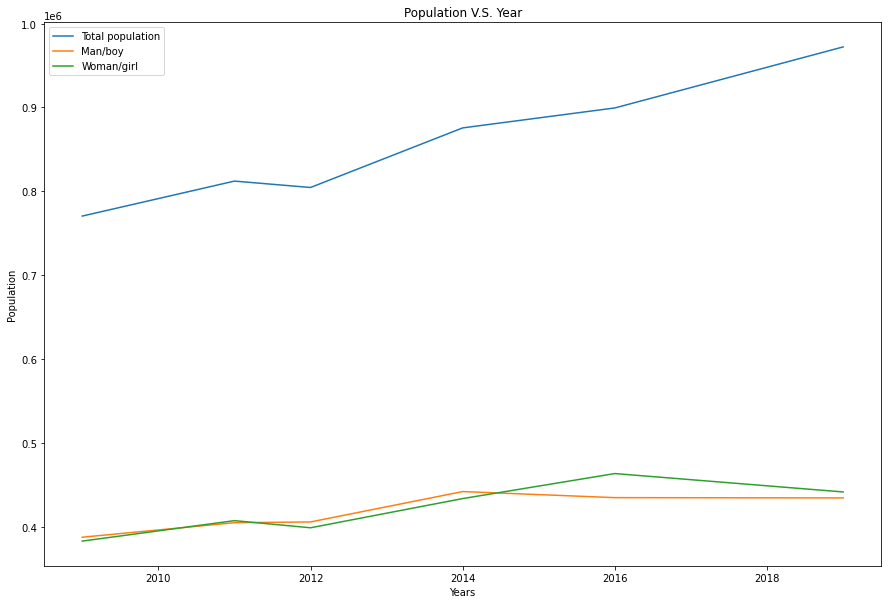

In [229]:
dtp.index = dtp.index.map(int) 
dtp.plot(kind='line',figsize=(15, 10))

plt.title('Population V.S. Year')
plt.ylabel('Population')
plt.xlabel('Years')

plt.legend(loc='upper left') 
plt.show()

### B3.2 Visualized using stacked butterfly chart

In [230]:
ticx=np.arange(-500000, 500000, 50000)
print(ticx)

[-500000 -450000 -400000 -350000 -300000 -250000 -200000 -150000 -100000
  -50000       0   50000  100000  150000  200000  250000  300000  350000
  400000  450000]


In [231]:
ticx2=abs(ticx)
print(ticx2)

[500000 450000 400000 350000 300000 250000 200000 150000 100000  50000
      0  50000 100000 150000 200000 250000 300000 350000 400000 450000]


In [232]:
!pip install plotly==3.10.0

     |████████████████████████████████| 41.5MB 5.5MB/s eta 0:00:01MB/s eta 0:00:03█████████████████████████     | 35.0MB 5.5MB/s eta 0:00:02     |███████████████████████████████▋| 41.0MB 5.5MB/s eta 0:00:01
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/d7/a9/33/acc7b709e2a35caa7d4cae442f6fe6fbf2c43f80823d46460c
Successfully built retrying


In [233]:
import plotly.plotly as py
import plotly.graph_objs as go

import numpy as np

#women_bins = np.array([-600, -623, -653, -650, -670, -578, -541, -411, -322, -230])
#men_bins = np.array([600, 623, 653, 650, 670, 578, 541, 360, 312, 170])
#women_with_dogs_bins = np.array([-0, -3, -308, -281, -245, -231, -212, -132, -74, -76])
#men_with_dogs_bins = np.array([0, 1, 300, 273, 256, 211, 201, 170, 145, 43])
F_19=df_2019c['Woman/girl']*-1
M_19=df_2019c['Man/boy']
F_16=df_2016c['Woman/girl']*-1
M_16=df_2016c['Man/boy']
F_14=df_2014c['Woman/girl']*-1
M_14=df_2014c['Man/boy']
F_12=df_2012c['Woman/girl']*-1
M_12=df_2012c['Man/boy']
F_09=df_2009c['Woman/girl']*-1
M_09=df_2009c['Man/boy']


y = list(range(2, 92, 5))
#y=df_2009c['Age range']

layout = go.Layout(yaxis=go.layout.YAxis(
                        title='Age (years)',
                        tickvals=list(range(2, 92, 5)),
                        ticktext=df_2009c['Age range'],
                        showgrid=True),
                   xaxis=go.layout.XAxis(
                       title='Number',
                       tickvals=[-40000,-30000,-20000,-10000,0,10000,20000,30000,40000],
                        ticktext=['40K','30K','20K','10K','0','10K','20K','30K','40K'],
                       showgrid=True), 
                   #plot_bgcolor='lightgrey',
                   barmode='overlay',
                   bargap=0.1,
    # Mean lines
    shapes= [
   #{'line': {'color': 'black', 'dash': 'dash', 'width': 1},
    #'type': 'line',
    #'x0': df_2019c['Woman/girl'].mean()*-1,
    #'x1': df_2019c['Woman/girl'].mean()*-1,
    #'xref': 'x',
    #'y0': -0.1,
    #'y1': 1,
    #'yref': 'paper'},
   {'line': {'color': 'darkblue', 'dash': 'dash', 'width': 1},
    'type': 'line',
    'x0': 0.5,
    'x1': 1,
    'xref': 'paper',
    'y0': age2019M,
    'y1': age2019M,
    'yref': 'y'},
   {'line': {'color': 'red', 'dash': 'dash', 'width': 1},
    'type': 'line',
    'x0': 0,
    'x1': 0.5,
    'xref': 'paper',
    'y0': age2019F,
    'y1': age2019F,
    'yref': 'y'},
        
#    {'line': {'color': 'darkblue', 'dash': 'dash', 'width': 1},
#    'type': 'line',
#    'x0': 0.5,
#    'x1': 1,
#    'xref': 'paper',
#    'y0': age2016M,
#    'y1': age2016M,
#    'yref': 'y'},
#   {'line': {'color': 'red', 'dash': 'dash', 'width': 1},
#    'type': 'line',
#    'x0': 0,
#    'x1': 0.5,
#    'xref': 'paper',
#    'y0': age2016F,
#    'y1': age2016F,
#    'yref': 'y'},
        
#    {'line': {'color': 'darkblue', 'dash': 'dash', 'width': 1},
#    'type': 'line',
#    'x0': 0.5,
#    'x1': 1,
#    'xref': 'paper',
#    'y0': age2014M,
#    'y1': age2014M,
#    'yref': 'y'},
#   {'line': {'color': 'red', 'dash': 'dash', 'width': 1},
#    'type': 'line',
#    'x0': 0,
#    'x1': 0.5,
#    'xref': 'paper',
#    'y0': age2014F,
#    'y1': age2014F,
#    'yref': 'y'},
        
#    {'line': {'color': 'darkblue', 'dash': 'dash', 'width': 1},
#    'type': 'line',
#    'x0': 0.5,
#    'x1': 1,
#    'xref': 'paper',
#    'y0': age2012M,
#    'y1': age2012M,
#    'yref': 'y'},
#   {'line': {'color': 'red', 'dash': 'dash', 'width': 1},
#    'type': 'line',
#    'x0': 0,
#    'x1': 0.5,
#    'xref': 'paper',
#    'y0': age2012F,
#    'y1': age2012F,
#    'yref': 'y'},
        
#    {'line': {'color': 'darkblue', 'dash': 'dash', 'width': 1},
#    'type': 'line',
#    'x0': 0.5,
#    'x1': 1,
#    'xref': 'paper',
#    'y0': age2009M,
#    'y1': age2009M,
#    'yref': 'y'},
#   {'line': {'color': 'red', 'dash': 'dash', 'width': 1},
#    'type': 'line',
#    'x0': 0,
#    'x1': 0.5,
#    'xref': 'paper',
#    'y0': age2009F,
#    'y1': age2009F,
#    'yref': 'y'},
        
 #    {'line': {'color': 'powderblue', 'dash': 'dot', 'width': 1},
 #   'type': 'line',
 #   'x0': 0.5,
 #   'x1': 1,
 #   'xref': 'paper',
 #   'y0': m2019M,
 #   'y1': m2019M,
 #   'yref': 'y'},
 #  {'line': {'color': 'lightpink', 'dash': 'dot', 'width': 1},
#    'type': 'line',
#    'x0': 0,
#    'x1': 0.5,
#    'xref': 'paper',
#    'y0': m2019F,
#    'y1': m2019F,
#    'yref': 'y'},
        
#      {'line': {'color': 'paleturquoise', 'dash': 'dot', 'width': 1},
#    'type': 'line',
#    'x0': 0.5,
#    'x1': 1,
#    'xref': 'paper',
#    'y0': m2016M,
#    'y1': m2016M,
#    'yref': 'y'},
#   {'line': {'color': 'lightsalmon', 'dash': 'dot', 'width': 1},
#    'type': 'line',
#    'x0': 0,
#    'x1': 0.5,
#    'xref': 'paper',
#    'y0': m2016F,
#    'y1': m2016F,
#    'yref': 'y'},
        
#   {'line': {'color': 'mediumturquoise', 'dash': 'dot', 'width': 1},
#    'type': 'line',
#    'x0': 0.5,
#    'x1': 1,
#    'xref': 'paper',
#    'y0': m2014M,
#    'y1': m2014M,
#    'yref': 'y'},
#   {'line': {'color': 'indianred', 'dash': 'dot', 'width': 1},
#    'type': 'line',
#    'x0': 0,
#    'x1': 0.5,
#    'xref': 'paper',
#    'y0': m2014F,
#    'y1': m2014F,
#    'yref': 'y'},
        
#   {'line': {'color': 'royalblue', 'dash': 'dot', 'width': 1},
#    'type': 'line',
#    'x0': 0.5,
#    'x1': 1,
#    'xref': 'paper',
#    'y0': m2012M,
#    'y1': m2012M,
#    'yref': 'y'},
#   {'line': {'color': 'hotpink', 'dash': 'dot', 'width': 1},
#    'type': 'line',
#    'x0': 0,
#    'x1': 0.5,
#    'xref': 'paper',
#    'y0': m2012F,
#    'y1': m2012F,
#    'yref': 'y'},
        
#        {'line': {'color': 'teal', 'dash': 'dot', 'width': 1},
#    'type': 'line',
#    'x0': 0.5,
#    'x1': 1,
#    'xref': 'paper',
#    'y0': m2009M,
#    'y1': m2009M,
#    'yref': 'y'},
#   {'line': {'color': 'deeppink', 'dash': 'dot', 'width': 1},
#    'type': 'line',
#    'x0': 0,
#    'x1': 0.5,
#    'xref': 'paper',
#    'y0': m2009F,
#    'y1': m2009F,
#    'yref': 'y'}
    ],
      
                   
     # Annotations
    annotations=[
        dict(
            x=0.97,
            y=age2019M,
            yref='y',
            xref='paper',
            text="2019Mean"),
            #text="2019 Mean: {:,.0f} ".format(age2019M)),
        dict(
            x=0.05,
            y=age2019F,
            yref='y',
            xref='paper',
            text="2019Mean"),
            #text="2019 Mean: {:,.0f} ".format(age2019F)),
        
#        dict(
#            x=0.9,
#            y=age2016M,
#            yref='y',
#            xref='paper',
#            text="2016"),
#        dict(
#            x=0.1,
#            y=age2016F,
#            yref='y',
#            xref='paper',
#            text="2016"),
        
#        dict(
#            x=0.85,
#            y=age2014M,
#            yref='y',
#            xref='paper',
#            text="2014"),
#        dict(
#            x=0.15,
#            y=age2014F,
#            yref='y',
#            xref='paper',
#            text="2014"),
        
#        dict(
#            x=0.8,
#            y=age2012M,
#            yref='y',
#            xref='paper',
#            text="2012"),
#        dict(
#            x=0.2,
#            y=age2012F,
#            yref='y',
#            xref='paper',
#            text="2012"),
        
#        dict(
#            x=0.75,
#            y=age2009M,
#            yref='y',
#            xref='paper',
#            text="2009"),
#        dict(
#            x=0.25,
#            y=age2009F,
#            yref='y',
#            xref='paper',
#            text="2009"),
        
#        dict(x=5000,
#             y=m2019M,
#             text="2019Mode"),
#         dict(x=-5000,
#             y=m2019F,
#             text="2019Mode"),
        
#        dict(x=10000,
#             y=m2016M,
#             text="2016Mode"),
#         dict(x=-10000,
#             y=m2016F,
#             text="2016Mode"),
        
#        dict(x=15000,
#             y=m2014M,
#             text="2014&2012Mode"),
#         dict(x=-15000,
#             y=m2014F,
#             text="2014&2012Mode"),
        
#        dict(x=20000,
#             y=m2009M,
#             text="2009Mode"),
#         dict(x=-20000,
#             y=m2009F,
#             text="2009Mode"),
    ]

)




data = [go.Bar(y=y,
               x=M_19,
               width=1*5,
               orientation='h',
               name='Man/boy_2019',
               hoverinfo='x',
               marker=dict(color='powderblue')
               ),
        go.Bar(y=y,
               x=F_19,
               width=1*5,
               orientation='h',
               name='Woman/girl_2019',
               text=-1* F_19,
               hoverinfo='text',
               marker=dict(color='lightpink')
               ),
        go.Bar(y=y,
               x=M_16,
               width=0.85*5,
               orientation='h',
               name='Man/boy_2016',
               hoverinfo='x',
               showlegend=True,
               opacity=0.7,
               marker=dict(color='darkturquoise')
               ),
        go.Bar(y=y,
               x=F_16,
               width=0.85*5,
               orientation='h',
               name='Woman/girl_2016',
               text=-1* F_16,
               hoverinfo='text',
               showlegend=True,
               opacity=0.7,
               marker=dict(color='lightsalmon')
               ),
        go.Bar(y=y,
               x=M_14,
               width=0.7*5,
               orientation='h',
               name='Man/boy_2014',
               hoverinfo='x',
               showlegend=True,
               opacity=0.6,
               marker=dict(color="dodgerblue")#'mediumturquoise')
               ),
        go.Bar(y=y,
               x=F_14,
               width=0.7*5,
               orientation='h',
               name='Woman/girl_2014',
               text=-1* F_14,
               hoverinfo='text',
               showlegend=True,
               opacity=0.6,
               marker=dict(color='indianred')
               ),
         go.Bar(y=y,
               x=M_12,
               width=0.55*5,
               orientation='h',
               name='Man/boy_2012',
               hoverinfo='x',
               showlegend=True,
               opacity=0.5,
               marker=dict(color='royalblue')
               ),
        go.Bar(y=y,
               x=F_12,
               width=0.55*5,
               orientation='h',
               name='Woman/girl_2012',
               text=-1* F_12,
               hoverinfo='text',
               showlegend=True,
               opacity=0.6,
               marker=dict(color='hotpink')#'tomato')
               ),
        go.Bar(y=y,
               x=M_09,
               width=0.4*5,
               orientation='h',
               name='Man/boy_2009',
               hoverinfo='x',
               showlegend=True,
               opacity=0.5,
               marker=dict(color='teal')
               ),
        go.Bar(y=y,
               x=F_09,
               width=0.4*5,
               orientation='h',
               name='Woman/girl_2009',
               text=-1* F_09,
               hoverinfo='text',
               showlegend=True,
               opacity=0.4,
               marker=dict(color='deeppink')
               ),
         go.Bar(y=[age2019M],
               x=[40000],
               width=std2019M*2,
               orientation='h',
               name='68.26 % of the population',
               text=40000,
               hoverinfo='text',
               showlegend=True,
               opacity=0.4,
               marker=dict(color='grey')
               ),
          go.Bar(y=[age2019F],
               x=[-40000],
               width=std2019F*2,
               orientation='h',
               name='68.26 % of the population in 2019',
               text=-40000,
               hoverinfo='text',
               showlegend=False,
               opacity=0.4,
               marker=dict(color='grey')
               ),
       ]


In [234]:
import plotly
plotly.tools.set_credentials_file(username='Evolzzz ', api_key='7CqpeTlqBBHSN2ycNawE ')

from chart_studio.tools import set_config_file
set_config_file(
    plotly_domain="https://plotly.com", 
    plotly_api_domain="https://api.plotly.com"
)

In [235]:
import plotly as py

fig = dict( data=data, layout=layout )
py.offline.plot(fig, filename='population_pyramid.html' )


'population_pyramid.html'

### B3.4 Visualized MEAN, MEDIAN, MODE

In [236]:
dataM = {'Year': [2009,2011,2012,2014,2016,2019],
            'Male Mean':[age2009M,age2011M,age2012M,age2014M,age2016M,age2019M],
            'Female Mean':[age2009F,age2011F,age2012F,age2014F,age2016F,age2019F],
            'Male Median':[mid2009M,mid2011M,mid2012M,mid2014M,mid2016M,mid2019M],
            'Female Median':[mid2009F,mid2011F,mid2012F,mid2014F,mid2016F,mid2019F],
             'Male Mode':[m2009M,m2011M,m2012M,m2014M,m2016M,m2019M],
            'Female Mode':[m2009F,m2011F,m2012F,m2014F,m2016F,m2019F],
        }

dtM = pd.DataFrame (dataM, columns = ['Year','Male Mean','Female Mean','Male Median','Female Median','Male Mode','Female Mode'])
dtM.astype(float)
dtM

,Year,Male Mean,Female Mean,Male Median,Female Median,Male Mode,Female Mode
0,2009,35.223082,36.612625,32.0,37.0,17,17
1,2011,36.423649,38.130240,35.3,36.9,22,22
2,2012,35.561902,36.828611,32.0,37.0,22,22
3,2014,35.978627,37.508441,32.0,37.0,22,22
4,2016,36.903240,38.255208,37.0,37.0,27,27
5,2019,37.236300,38.434355,37.0,37.0,27,27


In [237]:
dtM.columns[1]

'Male Mean'

In [238]:
dtM.iloc[5][6] #[n][m]=[at (n+1)th nrow][at (m+1)th column]

27.0

In [239]:
a=dtM.shape
r=a[0] #max is 5+1 row
c=a[1] #max is 6+1 column

for i in range(1,c):
    for j in range (r):
        v=dtM.iloc[j][i]
        if 14<v<20:
            dtM.at[j,dtM.columns[i]]=3
        elif 20<=v<25:
            dtM.at[j,dtM.columns[i]]=4
        elif 25<=v<30:
            dtM.at[j,dtM.columns[i]]=5
        elif 30<=v<35:
            dtM.at[j,dtM.columns[i]]=6
        elif 35<=v<40:
            dtM.at[j,dtM.columns[i]]=7
dtM            

,Year,Male Mean,Female Mean,Male Median,Female Median,Male Mode,Female Mode
0,2009,7.0,7.0,6.0,7.0,3,3
1,2011,7.0,7.0,7.0,7.0,4,4
2,2012,7.0,7.0,6.0,7.0,4,4
3,2014,7.0,7.0,6.0,7.0,4,4
4,2016,7.0,7.0,7.0,7.0,5,5
5,2019,7.0,7.0,7.0,7.0,5,5


In [240]:
label=dtM.copy()
label=label.astype(str)

a=label.shape
r=a[0] #max is 5+1 row
c=a[1] #max is 6+1 column

for i in range(1,c):
    for j in range (r):
        v=float(label.iloc[j][i])
        if v==3:
            label.at[j,label.columns[i]]='15 to 19'
        elif v==4:
            label.at[j,label.columns[i]]='20 to 24'
        elif v==5:
            label.at[j,label.columns[i]]='25 to 29'
        elif v==6:
            label.at[j,label.columns[i]]='30 to 34'
        elif v==7:
            label.at[j,label.columns[i]]='35 to 39'
label       

,Year,Male Mean,Female Mean,Male Median,Female Median,Male Mode,Female Mode
0,2009,35 to 39,35 to 39,30 to 34,35 to 39,15 to 19,15 to 19
1,2011,35 to 39,35 to 39,35 to 39,35 to 39,20 to 24,20 to 24
2,2012,35 to 39,35 to 39,30 to 34,35 to 39,20 to 24,20 to 24
3,2014,35 to 39,35 to 39,30 to 34,35 to 39,20 to 24,20 to 24
4,2016,35 to 39,35 to 39,35 to 39,35 to 39,25 to 29,25 to 29
5,2019,35 to 39,35 to 39,35 to 39,35 to 39,25 to 29,25 to 29


In [241]:
z=dtM.copy()
x=label.copy()
#z=z.astype(int)
#z.drop("Year",axis=1, inplace=True)
z=z.set_index('Year')#, inplace=True)
x=x.set_index('Year')#, inplace=True)
z

,Male Mean,Female Mean,Male Median,Female Median,Male Mode,Female Mode
Year,,,,,,
2009,7.0,7.0,6.0,7.0,3,3
2011,7.0,7.0,7.0,7.0,4,4
2012,7.0,7.0,6.0,7.0,4,4
2014,7.0,7.0,6.0,7.0,4,4
2016,7.0,7.0,7.0,7.0,5,5
2019,7.0,7.0,7.0,7.0,5,5


In [242]:
#import numpy as np 
#from pandas import DataFrame
import seaborn as sns
#%matplotlib inline

Text(0.5, 15.0, 'Age range falls in')

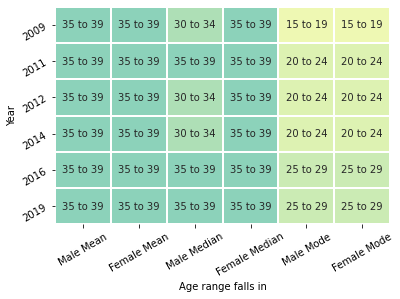

In [243]:
fig, ax = plt.subplots()
ax = sns.heatmap(z,vmin=1, vmax=18, annot = x, fmt = '',linewidths=1, linecolor='white',cbar=False,cmap="YlGnBu",)
#heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=30) 
#heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=90)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
ax.set_yticklabels(ax.get_yticklabels(), rotation=30)
plt.xlabel("Age range falls in")
#sns.heatmap(z, annot=False)

## B4. Store for other notebook

In [244]:
%store dN_2019n2

Stored 'dN_2019n2' (DataFrame)


In [245]:
%store dN_2016n2

Stored 'dN_2016n2' (DataFrame)


In [246]:
%store dN_2014n2

Stored 'dN_2014n2' (DataFrame)


In [247]:
%store dN_2012n2

Stored 'dN_2012n2' (DataFrame)


In [248]:
%store dN_2009n2

Stored 'dN_2009n2' (DataFrame)


## B5. Top neighbourhoods with the highest Millennials population per net residential hectare    
People in this age range consumpt the most overall alcohol

 - https://www150.statcan.gc.ca/n1/pub/82-625-x/2017001/article/54861-eng.htm
 - https://www.ccsa.ca/sites/default/files/2019-04/CCSA-Canadian-Drug-Summary-Alcohol-2017-en.pdf
 - http://angusreid.org/wp-content/uploads/2018/08/2018.07.16-alcohol-ReleaseTables.pdf
 - http://angusreid.org/wp-content/uploads/2018/08/2018.07.25_Alcohol-and-Politics-release.pdf

Import data

Reference:    
 - https://data.edmonton.ca/Census/2019-Census-Population-by-Gender-Neighbourhood-War/akuj-yrqt 2019 Census - Population by Gender (Neighbourhood/Ward)

In [249]:
df_2019gender = pd.read_csv("https://data.edmonton.ca/api/views/akuj-yrqt/rows.csv?accessType=DOWNLOAD")
df_2019gender.head()

,Ward,Neighbourhood Number,Neighbourhood Name,Woman/girl,Man/boy,Identified as another gender,Prefer Not to Answer
0,Ward 1,4010,Alberta Park Industrial,0,0,0,0
1,Ward 1,4020,Aldergrove,2523,2479,14,288
2,Ward 1,4011,Anthony Henday,0,0,0,0
3,Ward 1,4018,Anthony Henday Big Lake,0,0,0,0
4,Ward 1,4030,Armstrong Industrial,170,0,0,0


Reference:    
 - https://data.edmonton.ca/Census/2019-Census-Population-by-Age-Range-Neighbourhood-/a6zx-dzqn 2019 Census - Population by Age Range

In [250]:
df_2019age = pd.read_csv("https://data.edmonton.ca/api/views/a6zx-dzqn/rows.csv?accessType=DOWNLOAD")
df_2019age.tail()

,Ward,Neighbourhood Number,Neighbourhood Name,Age Range,Population
7576,Ward 9,5468,Graydon Hill,60-64,13
7577,Ward 1,4510,Stone Industrial,65-69,0
7578,Ward 1,4474,Starling,50-54,70
7579,Ward 7,1120,Edmonton Northlands,55-59,0
7580,Ward 4,2390,Kernohan,45-49,141


In [251]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeisA['area_km2']=NeisA['area_km2'].astype(float)
NeisA['area_hectares']=NeisA['area_km2']*100
NeisA.head()

,geometry,area_km2,Neighbourhood,number,area_hectares
0,"MULTIPOLYGON (((-113.51204 53.51810, -113.5093...",1.235993,Queen Alexandra,5330,123.599332
1,"MULTIPOLYGON (((-113.44693 53.60496, -113.4460...",1.188673,Kildare,2400,118.867333
2,"MULTIPOLYGON (((-113.50260 53.50637, -113.5005...",0.883531,Allendale,5010,88.353064
3,"MULTIPOLYGON (((-113.52294 53.50390, -113.5229...",0.848906,Parkallen,5310,84.890641
4,"MULTIPOLYGON (((-113.56570 53.56909, -113.5658...",1.291675,Woodcroft,3450,129.167476


Clean data

In [252]:
df_2019age.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
# Create variable with TRUE if condition:
age1= df_2019age['Age Range'] == "25-29"
age2= df_2019age['Age Range'] == "30-34"
age3= df_2019age['Age Range'] == "35-39"
#age4= df_2019age['Age Range'] == "40-44"


# Select all cases where nationality is USA and age is greater than 50
df_2019age=df_2019age[age1 | age2 | age3]# | age4]
df_2019age.reset_index(drop=True, inplace=True)
df_2019age.tail()

,Ward,Neighbourhood Number,Neighbourhood,Age Range,Population
1192,Ward 10,5490,Sweet Grass,25-29,157
1193,Ward 1,4487,Secord,25-29,327
1194,Ward 11,6720,Tawa,35-39,132
1195,Ward 5,4467,River Valley Cameron,30-34,0
1196,Ward 7,2290,Glengarry,25-29,149


In [253]:
ds_2019age=df_2019age.copy()
ds_2019age = ds_2019age.groupby('Neighbourhood',axis=0)['Population'].sum().reset_index()
ds_2019age.rename(columns={'Population':'Millennials Population'}, inplace=True)
ds_2019age.head()

,Neighbourhood,Millennials Population
0,Abbottsfield,378
1,Albany,464
2,Alberta Avenue,1188
3,Alberta Park Industrial,0
4,Aldergrove,1053


In [254]:
df_2019gender.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
df_2019gender['Other'] = df_2019gender['Identified as another gender']+df_2019gender['Prefer Not to Answer']
df_2019gender['Total'] = df_2019gender['Woman/girl']+df_2019gender['Man/boy']+df_2019gender['Other']
df_2019gender.head()

,Ward,Neighbourhood Number,Neighbourhood,Woman/girl,Man/boy,Identified as another gender,Prefer Not to Answer,Other,Total
0,Ward 1,4010,Alberta Park Industrial,0,0,0,0,0,0
1,Ward 1,4020,Aldergrove,2523,2479,14,288,302,5304
2,Ward 1,4011,Anthony Henday,0,0,0,0,0,0
3,Ward 1,4018,Anthony Henday Big Lake,0,0,0,0,0,0
4,Ward 1,4030,Armstrong Industrial,170,0,0,0,0,170


In [255]:
df_2019sum = pd.merge(dclassMED,
                df_2019gender[['Neighbourhood','Woman/girl','Man/boy','Other','Total']],
                 on='Neighbourhood')
df_2019sum.head()

,Neighbourhood,Classification,Woman/girl,Man/boy,Other,Total
0,Abbottsfield,4,803,709,263,1775
1,Albany,1,765,730,281,1776
2,Alberta Avenue,4,2512,2554,1515,6581
3,Aldergrove,2,2523,2479,302,5304
4,Allard,1,3204,3186,457,6847


Merge 3 table in 1

In [256]:
ds_2019= pd.merge(df_2019sum,
                ds_2019age[['Neighbourhood','Millennials Population']],
                 on='Neighbourhood')
ds_2019= pd.merge(ds_2019,
                NeisA[['Neighbourhood','area_hectares']],
                 on='Neighbourhood')
ds_2019.head()

,Neighbourhood,Classification,Woman/girl,Man/boy,Other,Total,Millennials Population,area_hectares
0,Abbottsfield,4,803,709,263,1775,378,40.962908
1,Albany,1,765,730,281,1776,464,84.331223
2,Alberta Avenue,4,2512,2554,1515,6581,1188,168.047061
3,Aldergrove,2,2523,2479,302,5304,1053,149.059602
4,Allard,1,3204,3186,457,6847,2121,166.874405


In [257]:
ds_2019['Millennials Percentage']=ds_2019['Millennials Population']/ds_2019['Total']
ds_2019['Total Per Net Residential Hectare']=ds_2019['Total']/ds_2019['area_hectares']
ds_2019['Millennials Per Net Residential Hectare']=ds_2019['Millennials Population']/ds_2019['area_hectares']
ds_2019['Female Per Net Residential Hectare']=ds_2019['Woman/girl']/ds_2019['area_hectares']
ds_2019['Male Per Net Residential Hectare']=ds_2019['Man/boy']/ds_2019['area_hectares']
ds_2019['Female Millennials Per Net Residential Hectare']=ds_2019['Woman/girl']/ds_2019['Total']*ds_2019['Millennials Per Net Residential Hectare']
ds_2019['Male Millennials Per Net Residential Hectare']=ds_2019['Man/boy']/ds_2019['Total']*ds_2019['Millennials Per Net Residential Hectare']
ds_2019['Other Millennials Per Net Residential Hectare']=ds_2019['Other']/ds_2019['Total']*ds_2019['Millennials Per Net Residential Hectare']
ds_2019=ds_2019.round(1)
ds_2019.head()

,Neighbourhood,Classification,Woman/girl,Man/boy,Other,Total,Millennials Population,area_hectares,Millennials Percentage,Total Per Net Residential Hectare,Millennials Per Net Residential Hectare,Female Per Net Residential Hectare,Male Per Net Residential Hectare,Female Millennials Per Net Residential Hectare,Male Millennials Per Net Residential Hectare,Other Millennials Per Net Residential Hectare
0,Abbottsfield,4,803,709,263,1775,378,41.0,0.2,43.3,9.2,19.6,17.3,4.2,3.7,1.4
1,Albany,1,765,730,281,1776,464,84.3,0.3,21.1,5.5,9.1,8.7,2.4,2.3,0.9
2,Alberta Avenue,4,2512,2554,1515,6581,1188,168.0,0.2,39.2,7.1,14.9,15.2,2.7,2.7,1.6
3,Aldergrove,2,2523,2479,302,5304,1053,149.1,0.2,35.6,7.1,16.9,16.6,3.4,3.3,0.4
4,Allard,1,3204,3186,457,6847,2121,166.9,0.3,41.0,12.7,19.2,19.1,5.9,5.9,0.8


#### B-2019.5a Mature/core neighbourhood

In [258]:
dclassM=ds_2019.copy()

dclassM=dclassM[dclassM['Classification']!= 1]
dclassM=dclassM[dclassM['Classification']!= 2]

dclassM.reset_index(drop=True, inplace=True)
dclassM.tail()

,Neighbourhood,Classification,Woman/girl,Man/boy,Other,Total,Millennials Population,area_hectares,Millennials Percentage,Total Per Net Residential Hectare,Millennials Per Net Residential Hectare,Female Per Net Residential Hectare,Male Per Net Residential Hectare,Female Millennials Per Net Residential Hectare,Male Millennials Per Net Residential Hectare,Other Millennials Per Net Residential Hectare
106,Westmount,4,2835,2625,489,5949,1556,186.4,0.3,31.9,8.3,15.2,14.1,4.0,3.7,0.7
107,Westwood,4,1049,1289,1097,3435,697,98.3,0.2,34.9,7.1,10.7,13.1,2.2,2.7,2.3
108,Windsor Park,4,630,724,129,1483,190,75.8,0.1,19.6,2.5,8.3,9.6,1.1,1.2,0.2
109,Woodcroft,4,1249,1104,250,2603,407,129.2,0.2,20.2,3.2,9.7,8.5,1.5,1.3,0.3
110,York,4,1482,1413,1022,3917,570,118.9,0.1,32.9,4.8,12.5,11.9,1.8,1.7,1.3


In [259]:
d2019Mtop=dclassM.copy()
d2019Mtop.sort_values(['Millennials Per Net Residential Hectare'], inplace=True ,ascending=False)
d2019Mtop.reset_index(drop=True, inplace=True)
d2019Mtop.head()

,Neighbourhood,Classification,Woman/girl,Man/boy,Other,Total,Millennials Population,area_hectares,Millennials Percentage,Total Per Net Residential Hectare,Millennials Per Net Residential Hectare,Female Per Net Residential Hectare,Male Per Net Residential Hectare,Female Millennials Per Net Residential Hectare,Male Millennials Per Net Residential Hectare,Other Millennials Per Net Residential Hectare
0,Oliver,5,7672,7281,3227,18180,5553,171.0,0.3,106.3,32.5,44.9,42.6,13.7,13.0,5.8
1,Garneau,5,3021,3120,967,7108,2276,82.9,0.3,85.7,27.5,36.4,37.6,11.7,12.1,3.7
2,Downtown,6,4845,5337,2241,12423,5015,230.9,0.4,53.8,21.7,21.0,23.1,8.5,9.3,3.9
3,Strathcona,5,3467,3850,1856,9173,2708,156.3,0.3,58.7,17.3,22.2,24.6,6.5,7.3,3.5
4,Boyle Street,5,2359,2772,1630,6761,1442,88.1,0.2,76.7,16.4,26.8,31.5,5.7,6.7,3.9


In [260]:
d2019Mtop1=d2019Mtop.copy()
d2019Mtop1 = d2019Mtop1[d2019Mtop1['Millennials Per Net Residential Hectare'] > 8]
d2019Mtop1

,Neighbourhood,Classification,Woman/girl,Man/boy,Other,Total,Millennials Population,area_hectares,Millennials Percentage,Total Per Net Residential Hectare,Millennials Per Net Residential Hectare,Female Per Net Residential Hectare,Male Per Net Residential Hectare,Female Millennials Per Net Residential Hectare,Male Millennials Per Net Residential Hectare,Other Millennials Per Net Residential Hectare
0,Oliver,5,7672,7281,3227,18180,5553,171.0,0.3,106.3,32.5,44.9,42.6,13.7,13.0,5.8
1,Garneau,5,3021,3120,967,7108,2276,82.9,0.3,85.7,27.5,36.4,37.6,11.7,12.1,3.7
2,Downtown,6,4845,5337,2241,12423,5015,230.9,0.4,53.8,21.7,21.0,23.1,8.5,9.3,3.9
3,Strathcona,5,3467,3850,1856,9173,2708,156.3,0.3,58.7,17.3,22.2,24.6,6.5,7.3,3.5
4,Boyle Street,5,2359,2772,1630,6761,1442,88.1,0.2,76.7,16.4,26.8,31.5,5.7,6.7,3.9
5,Cromdale,4,816,883,307,2006,557,35.9,0.3,55.9,15.5,22.7,24.6,6.3,6.8,2.4
6,Empire Park,4,2206,2330,415,4951,1492,107.2,0.3,46.2,13.9,20.6,21.7,6.2,6.5,1.2
7,Queen Alexandra,4,1955,2039,1129,5123,1523,123.6,0.3,41.4,12.3,15.8,16.5,4.7,4.9,2.7
8,Queen Mary Park,5,2729,3099,1580,7408,2061,180.4,0.3,41.1,11.4,15.1,17.2,4.2,4.8,2.4
9,Inglewood,4,3041,2989,1290,7320,1698,165.0,0.2,44.4,10.3,18.4,18.1,4.3,4.2,1.8


In [261]:
d2019Mtop1.sort_values(['Millennials Per Net Residential Hectare'], inplace=True ,ascending=True)

dtopM2019=d2019Mtop1[['Neighbourhood','Female Millennials Per Net Residential Hectare', 'Male Millennials Per Net Residential Hectare', 'Other Millennials Per Net Residential Hectare']][0:len(d2019Mtop)]
dtopM2019.set_index('Neighbourhood', inplace=True)

dtopM2019=dtopM2019.astype(float)
#dtopM2019=dtopM2019.round(1)
dtopM2019

,Female Millennials Per Net Residential Hectare,Male Millennials Per Net Residential Hectare,Other Millennials Per Net Residential Hectare
Neighbourhood,,,
Westmount,4.0,3.7,0.7
Canora,3.7,3.8,1.0
Malmo Plains,3.9,3.9,0.7
Allendale,3.7,3.9,0.9
Parkdale,3.7,3.9,1.2
King Edward Park,4.0,4.0,0.8
Abbottsfield,4.2,3.7,1.4
Ritchie,3.8,3.7,1.9
Central McDougall,3.5,4.2,2.5


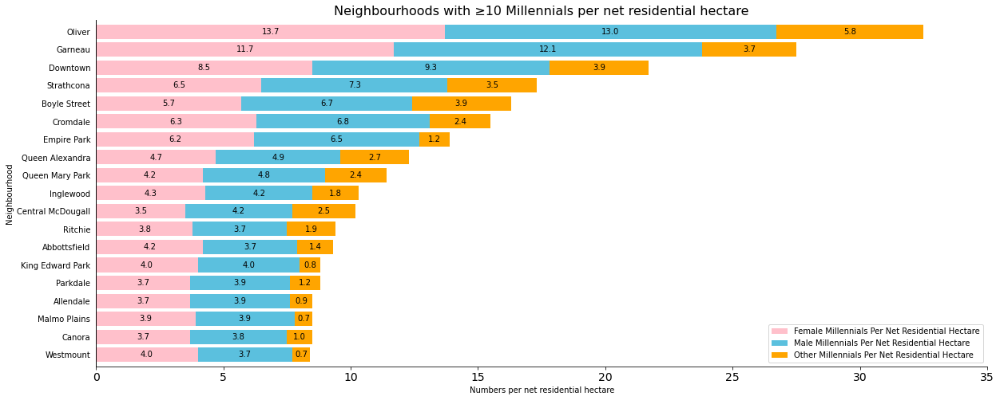

In [262]:
color_list = ['pink','#5bc0de', 'orange'] 

ax = dtopM2019.plot.barh(stacked=True,figsize = (20, 8), width = 0.8, color = color_list, align='center', edgecolor = None);



ax.set_title("Neighbourhoods with ≥10 Millennials per net residential hectare", fontsize = 16)#use font size 16 for the title
ax.legend(fontsize='10',facecolor='white')#use font size 14 for legend
ax.tick_params(axis='x', labelsize=14)#use font size 14 for axis-lable
ax.set_xlabel('Numbers per net residential hectare') 
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

for p in ax.patches:
    left, bottom, width, height = p.get_bbox().bounds
    ax.annotate(str(width.round(1)), xy=(left+width/2, bottom+height/2), 
                ha='center', va='center')

ax.set_xlim(0, 35)
    
# remove the left, top, and right borders; make sure the color of x axix labels is black
ax.set_facecolor('xkcd:white') # change background to white  #ax.set_facecolor('xkcd:white')
#ax.set_xticklabels([]) # turn off y ticks
ax.tick_params(left=False)
ax.axvline(0, color='black') # draw an x axix line 
ax.tick_params(axis='x', colors='black') # make sure the color of x axix labels is black    

### B-2019 Heat map Population per net residential hectare of Mature/Core Neighbourhood over the past 10 yrs

Get the geographical coordinates for each borough in Edmonton

In [263]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [264]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                d2019Mtop[['Neighbourhood','Millennials Per Net Residential Hectare']],
                 on='Neighbourhood')
NeiAmerge['Millennials Per Net Residential Hectare']=NeiAmerge['Millennials Per Net Residential Hectare'].astype(float)
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Millennials Per Net Residential Hectare
106,"MULTIPOLYGON (((-113.53878 53.54391, -113.5386...",1.864285426990618,Westmount,3440,8.3
107,"MULTIPOLYGON (((-113.50842 53.54826, -113.5139...",1.803836239338689,Queen Mary Park,1180,11.4
108,"MULTIPOLYGON (((-113.53121 53.58096, -113.5311...",0.790117279662749,Prince Charles,3350,4.4
109,"MULTIPOLYGON (((-113.53952 53.58392, -113.5404...",1.348177940367639,Calder,3070,5.5
110,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070,1.7


In [265]:
NeiAmerge['Millennials Per Net Residential Hectare'].max()

32.5

In [266]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09
colormap = cm.linear.PiYG_04.scale(0,NeiAmerge['Millennials Per Net Residential Hectare'].max()).to_step(4) 
colormap

In [267]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')
colormap.caption = "Numbers of people in age range 25-44 per net residential hectareper"

style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Millennials Per Net Residential Hectare']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Millennials Per Net Residential Hectare'],
        aliases=['Neighbourhood','Millennials Population Per Net Residential Hectareper Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)
edmA_map

#### B-2019.5b Established/developing neighbourhood

In [268]:
dclassED=ds_2019.copy()

dclassED=dclassED[dclassED['Classification']!= 4]
dclassED=dclassED[dclassED['Classification']!= 5]
dclassED=dclassED[dclassED['Classification']!= 6]

#dclassED.reset_index(drop=True, inplace=True)
dclassED.tail()

,Neighbourhood,Classification,Woman/girl,Man/boy,Other,Total,Millennials Population,area_hectares,Millennials Percentage,Total Per Net Residential Hectare,Millennials Per Net Residential Hectare,Female Per Net Residential Hectare,Male Per Net Residential Hectare,Female Millennials Per Net Residential Hectare,Male Millennials Per Net Residential Hectare,Other Millennials Per Net Residential Hectare
279,Westridge,2,630,643,47,1320,147,73.1,0.1,18.1,2.0,8.6,8.8,1.0,1.0,0.1
280,Westview Village,2,793,813,518,2124,272,92.5,0.1,23.0,2.9,8.6,8.8,1.1,1.1,0.7
282,Wild Rose,2,3897,3902,732,8531,1645,177.2,0.2,48.1,9.3,22.0,22.0,4.2,4.2,0.8
283,Windermere,1,5272,5200,779,11251,3011,477.3,0.3,23.6,6.3,11.0,10.9,3.0,2.9,0.4
284,Windermere Area,1,0,0,0,0,0,371.3,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN


In [269]:
d2019EDtop=dclassED.copy()
d2019EDtop.sort_values(['Millennials Per Net Residential Hectare'], inplace=True ,ascending=False)
d2019EDtop.reset_index(drop=True, inplace=True)
d2019EDtop.head()

,Neighbourhood,Classification,Woman/girl,Man/boy,Other,Total,Millennials Population,area_hectares,Millennials Percentage,Total Per Net Residential Hectare,Millennials Per Net Residential Hectare,Female Per Net Residential Hectare,Male Per Net Residential Hectare,Female Millennials Per Net Residential Hectare,Male Millennials Per Net Residential Hectare,Other Millennials Per Net Residential Hectare
0,Callingwood South,2,2546,2322,804,5672,1323,77.2,0.2,73.4,17.1,33.0,30.1,7.7,7.0,2.4
1,South Terwillegar,1,4635,4566,552,9753,2704,174.3,0.3,56.0,15.5,26.6,26.2,7.4,7.3,0.9
2,Glenridding Heights,1,1733,1743,317,3793,1343,92.6,0.4,41.0,14.5,18.7,18.8,6.6,6.7,1.2
3,Laurel,1,5782,5848,519,12149,3678,280.2,0.3,43.4,13.1,20.6,20.9,6.2,6.3,0.6
4,Callaghan,1,1838,1779,383,4000,1065,81.8,0.3,48.9,13.0,22.5,21.8,6.0,5.8,1.2


In [270]:
d2019EDtop1=d2019EDtop.copy()
d2019EDtop1 = d2019EDtop1[d2019EDtop1['Millennials Per Net Residential Hectare'] > 8]
d2019EDtop1

,Neighbourhood,Classification,Woman/girl,Man/boy,Other,Total,Millennials Population,area_hectares,Millennials Percentage,Total Per Net Residential Hectare,Millennials Per Net Residential Hectare,Female Per Net Residential Hectare,Male Per Net Residential Hectare,Female Millennials Per Net Residential Hectare,Male Millennials Per Net Residential Hectare,Other Millennials Per Net Residential Hectare
0,Callingwood South,2,2546,2322,804,5672,1323,77.2,0.2,73.4,17.1,33.0,30.1,7.7,7.0,2.4
1,South Terwillegar,1,4635,4566,552,9753,2704,174.3,0.3,56.0,15.5,26.6,26.2,7.4,7.3,0.9
2,Glenridding Heights,1,1733,1743,317,3793,1343,92.6,0.4,41.0,14.5,18.7,18.8,6.6,6.7,1.2
3,Laurel,1,5782,5848,519,12149,3678,280.2,0.3,43.4,13.1,20.6,20.9,6.2,6.3,0.6
4,Callaghan,1,1838,1779,383,4000,1065,81.8,0.3,48.9,13.0,22.5,21.8,6.0,5.8,1.2
5,Allard,1,3204,3186,457,6847,2121,166.9,0.3,41.0,12.7,19.2,19.1,5.9,5.9,0.8
6,MacEwan,1,2720,2589,752,6061,1453,114.1,0.2,53.1,12.7,23.8,22.7,5.7,5.4,1.6
7,Walker,1,5319,5421,840,11580,3311,263.4,0.3,44.0,12.6,20.2,20.6,5.8,5.9,0.9
8,Crystallina Nera West,1,1226,1230,534,2990,1011,84.0,0.3,35.6,12.0,14.6,14.6,4.9,4.9,2.1
9,Rutherford,1,5478,5259,749,11486,2564,225.0,0.2,51.0,11.4,24.3,23.4,5.4,5.2,0.7


In [271]:
d2019EDtop1.sort_values(['Millennials Per Net Residential Hectare'], inplace=True ,ascending=True)

dtopED2019=d2019EDtop1[['Neighbourhood','Female Millennials Per Net Residential Hectare', 'Male Millennials Per Net Residential Hectare', 'Other Millennials Per Net Residential Hectare']][0:len(d2019EDtop)]
dtopED2019.set_index('Neighbourhood', inplace=True)
dtopED2019=dtopED2019.astype(float)
dtopED2019

,Female Millennials Per Net Residential Hectare,Male Millennials Per Net Residential Hectare,Other Millennials Per Net Residential Hectare
Neighbourhood,,,
Cumberland,3.5,3.3,1.3
Sifton Park,3.6,3.8,0.7
Carlisle,3.9,3.7,0.6
Schonsee,3.8,3.5,1.0
Bannerman,3.9,3.8,0.6
Clareview Town Centre,4.1,3.8,0.6
Thorncliff,4.2,4.1,0.5
Ellerslie,4.0,4.1,0.7
Silver Berry,4.0,4.1,0.8


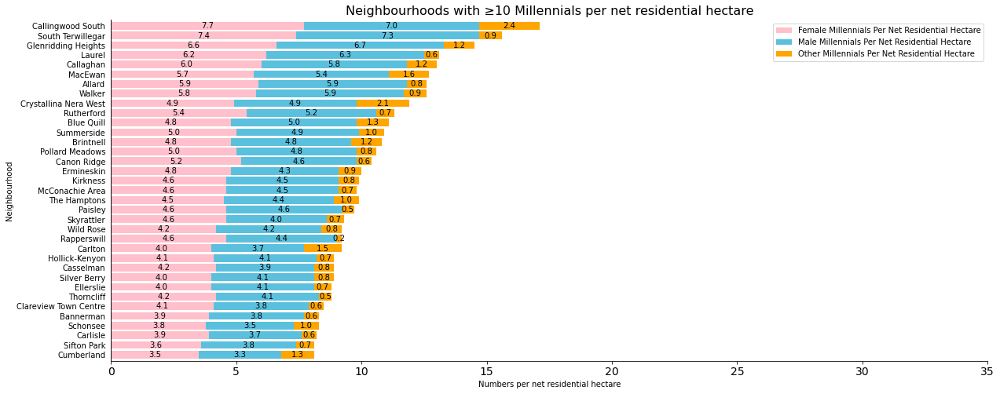

In [272]:
color_list = ['pink','#5bc0de', 'orange'] 

ax = dtopED2019.plot.barh(stacked=True,figsize = (20, 8), width = 0.8, color = color_list, align='center', edgecolor = None);



ax.set_title("Neighbourhoods with ≥10 Millennials per net residential hectare", fontsize = 16)#use font size 16 for the title
ax.legend(fontsize='10',facecolor='white')#use font size 14 for legend
ax.tick_params(axis='x', labelsize=14)#use font size 14 for axis-lable
ax.set_xlabel('Numbers per net residential hectare') 
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

for p in ax.patches:
    left, bottom, width, height = p.get_bbox().bounds
    ax.annotate(str(width.round(1)), xy=(left+width/2, bottom+height/2), 
                ha='center', va='center')
    
ax.set_xlim(0, 35)
    
# remove the left, top, and right borders; make sure the color of x axix labels is black
ax.set_facecolor('xkcd:white') # change background to white  #ax.set_facecolor('xkcd:white')
#ax.set_xticklabels([]) # turn off y ticks
ax.tick_params(left=False)
ax.axvline(0, color='black') # draw an x axix line 
ax.tick_params(axis='x', colors='black') # make sure the color of x axix labels is black    

### B-2019 Heat map Population per net residential hectare of Established/Developing Neighbourhood over the past 10 yrs

Get the geographical coordinates for each borough in Edmonton

In [273]:

import geopandas as gpd
response = requests.get(r"https://data.edmonton.ca/api/geospatial/tvcx-3vrx?method=export&format=GeoJSON")
data = response.json()
NeisA = gpd.GeoDataFrame.from_features(data, crs='EPSG:4326')

NeisA.tail()

,geometry,area_km2,name,number
396,"MULTIPOLYGON (((-113.61535 53.60494, -113.6147...",6.780354039561549,Mistatim Industrial,4320
397,"MULTIPOLYGON (((-113.59041 53.56654, -113.5903...",0.664647754277497,Alberta Park Industrial,4010
398,"MULTIPOLYGON (((-113.59041 53.56654, -113.5904...",0.664488131212018,Garside Industrial,4170
399,"MULTIPOLYGON (((-113.47155 53.53287, -113.4717...",1.091063753389666,Cloverdale,6070
400,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220


In [274]:
NeisA.rename(columns={'name':'Neighbourhood'}, inplace=True)
NeiAmerge = pd.merge(NeisA,
                d2019EDtop[['Neighbourhood','Millennials Per Net Residential Hectare']],
                 on='Neighbourhood')
NeiAmerge['Millennials Per Net Residential Hectare']=NeiAmerge['Millennials Per Net Residential Hectare'].astype(float)
NeiAmerge.tail()

,geometry,area_km2,Neighbourhood,number,Millennials Per Net Residential Hectare
172,"MULTIPOLYGON (((-113.38516 53.58764, -113.3846...",1.263276817863978,Belmont,2070,7.8
173,"MULTIPOLYGON (((-113.67474 53.59756, -113.6747...",2.411951017045634,Trumpeter Area,4471,2.3
174,"MULTIPOLYGON (((-113.38192 53.58676, -113.3821...",0.891282105009076,Kernohan,2390,6.2
175,"MULTIPOLYGON (((-113.65139 53.47496, -113.6513...",0.708630278022513,Wedgewood Heights,4570,2.6
176,"MULTIPOLYGON (((-113.65120 53.48227, -113.6518...",1.083079502099643,Jamieson Place,4220,6.1


In [275]:
NeiAmerge['Millennials Per Net Residential Hectare'].max()

17.1

In [276]:
import branca.colormap as cm
#colormap = cm.linear.YlGnBu_09#PuOr
colormap = cm.linear.PiYG_04.scale(0,32).to_step(4) 
colormap

In [277]:
from folium.features import GeoJson, GeoJsonTooltip, GeoJsonPopup

# create a plain world map
edmA_map = folium.Map(location=[latitude, longitude], zoom_start=10) #, tiles = 'Stamen Toner')
colormap.caption = "Numbers of Millennials per net residential hectareper"

style_function = lambda x: {"weight":0.5, 
                            'color':'black',
                            'fillColor':colormap(x['properties']['Millennials Per Net Residential Hectare']), 
                            'fillOpacity':0.75}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}



g = folium.GeoJson(
    NeiAmerge,
    style_function=style_function,
    control=False,
    highlight_function=highlight_function,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Neighbourhood','Millennials Per Net Residential Hectare'],
        aliases=['Neighbourhood','Millennials Population Per Net Residential Hectareper Neighbourhood'],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
        sticky=True
        )).add_to(edmA_map)

colormap.add_to(edmA_map)
edmA_map

### B5-Summary top neighbourhood citywise

In [278]:
dtopED2019.index[0]

'Cumberland'

In [279]:
dtopneib=[]
for i in range((len(dtopED2019.index))):
    dtopneib.append(dtopED2019.index[i])
for i in range((len(dtopM2019.index))):
    dtopneib.append(dtopM2019.index[i])
print(dtopneib)

['Cumberland', 'Sifton Park', 'Carlisle', 'Schonsee', 'Bannerman', 'Clareview Town Centre', 'Thorncliff', 'Ellerslie', 'Silver Berry', 'Casselman', 'Hollick-Kenyon', 'Carlton', 'Rapperswill', 'Wild Rose', 'Skyrattler', 'Paisley', 'The Hamptons', 'McConachie Area', 'Kirkness', 'Ermineskin', 'Canon Ridge', 'Pollard Meadows', 'Brintnell', 'Summerside', 'Blue Quill', 'Rutherford', 'Crystallina Nera West', 'Walker', 'Allard', 'MacEwan', 'Callaghan', 'Laurel', 'Glenridding Heights', 'South Terwillegar', 'Callingwood South', 'Westmount', 'Canora', 'Malmo Plains', 'Allendale', 'Parkdale', 'King Edward Park', 'Abbottsfield', 'Ritchie', 'Central McDougall', 'Inglewood', 'Queen Mary Park', 'Queen Alexandra', 'Empire Park', 'Cromdale', 'Boyle Street', 'Strathcona', 'Downtown', 'Garneau', 'Oliver']


In [280]:
TopNeibourhood = {'Neighbourhood': dtopneib}
dtopNei = pd.DataFrame (TopNeibourhood, columns = ['Neighbourhood'])
dtopNei.tail()

,Neighbourhood
49,Boyle Street
50,Strathcona
51,Downtown
52,Garneau
53,Oliver


In [281]:
topNei_Mdensity=ds_2019.copy()
topNei_Mdensity = topNei_Mdensity[topNei_Mdensity['Millennials Per Net Residential Hectare'] > 8]
topNei_Mdensity=topNei_Mdensity[['Neighbourhood','Millennials Per Net Residential Hectare']]
topNei_Mdensity.reset_index(drop=True, inplace=True)
topNei_Mdensity.tail()

,Neighbourhood,Millennials Per Net Residential Hectare
49,The Hamptons,9.8
50,Thorncliff,8.8
51,Walker,12.6
52,Westmount,8.3
53,Wild Rose,9.3


### !!!!!!Store dtopNei: Core, Mature, Established, Developing Neighbourhoods with ≥10 Millennials per net residential hectare

In [282]:
%store dtopNei

Stored 'dtopNei' (DataFrame)


### !!!!!!Store topNei_Mdensity: Core, Mature, Established, Developing Neighbourhoods with ≥10 Millennials per net residential hectare

In [283]:
%store topNei_Mdensity

Stored 'topNei_Mdensity' (DataFrame)


## B6. Generation Overview
Reference:
 - https://www.researchgate.net/publication/342928285_A_Qualitative_Approach_to_the_Sustainable_Orientation_of_Generation_Z_in_Retail_The_Case_of_Romania Millennial,Generation Z
 - https://www.researchgate.net/publication/242760064_Marketing_to_the_Generations

In [284]:
dataG = {'Generation': ['Baby Boomers','Generation X','Millienials','Generation Z'],
            'Date of Birth':['1945-1964','1965-1979','1980-1994','1995-2004'],
         'Age in 2019':['55-74','40-54','25-39','15-24'],
         'Age in 2009':['45-64','30-44','15-29','5-14'],
        }

dG = pd.DataFrame (dataG, columns = ['Generation','Date of Birth','Age in 2019','Age in 2009'])
dG

,Generation,Date of Birth,Age in 2019,Age in 2009
0,Baby Boomers,1945-1964,55-74,45-64
1,Generation X,1965-1979,40-54,30-44
2,Millienials,1980-1994,25-39,15-29
3,Generation Z,1995-2004,15-24,5-14


## 2019 Generation

Reference:    
 - https://data.edmonton.ca/Census/2019-Census-Population-by-Age-Range-Neighbourhood-/a6zx-dzqn 2019 Census - Population by Age Range

In [285]:
d2019 = pd.read_csv("https://data.edmonton.ca/api/views/a6zx-dzqn/rows.csv?accessType=DOWNLOAD")
d2019.head()

,Ward,Neighbourhood Number,Neighbourhood Name,Age Range,Population
0,Ward 2,1230,Spruce Avenue,45-49,93
1,Ward 4,2720,York,45-49,159
2,Ward 8,6710,Strathearn,55-59,161
3,Ward 5,4140,Elmwood,65-69,126
4,Ward 8,5370,River Valley Mayfair,45-49,0


### Generation Z

In [286]:
dZ2019=d2019.copy()
dZ2019.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
# Create variable with TRUE if condition:
age1= dZ2019['Age Range'] == "15-19"
age2= dZ2019['Age Range'] == "20-24"
#age3= dZ2019['Age Range'] == "15-19"
#age4= dZ2019['Age Range'] == "20-24"


# Select all cases where nationality is USA and age is greater than 50
dZ2019=dZ2019[age1 | age2]# | age3 | age4]
dZ2019.reset_index(drop=True, inplace=True)
dZ2019.tail()

,Ward,Neighbourhood Number,Neighbourhood,Age Range,Population
793,Ward 4,2145,Clareview Town Centre,20-24,337
794,Ward 5,4570,Wedgewood Heights,15-19,74
795,Ward 7,2580,Northmount,20-24,162
796,Ward 2,1230,Spruce Avenue,15-19,50
797,Ward 2,3170,Dovercourt,15-19,66


In [287]:
dZ2019 = dZ2019.groupby('Neighbourhood',axis=0)['Population'].sum().reset_index()
dZ2019.rename(columns={'Population':'Generation Z Population'}, inplace=True)
dZ2019.head()

,Neighbourhood,Generation Z Population
0,Abbottsfield,205
1,Albany,131
2,Alberta Avenue,515
3,Alberta Park Industrial,0
4,Aldergrove,648


In [288]:
dZ2019 = pd.merge(dclassMED,
                dZ2019[['Neighbourhood','Generation Z Population']],
                 on='Neighbourhood')
dZ2019.head()

,Neighbourhood,Classification,Generation Z Population
0,Abbottsfield,4,205
1,Albany,1,131
2,Alberta Avenue,4,515
3,Aldergrove,2,648
4,Allard,1,605


citywise - Total Generation Z population

In [289]:
dZ2019total=dZ2019['Generation Z Population'].sum()
print(dZ2019total)

100446


Developing/established/mature/mature DT/mature core Neighbourhood - Total Generation Z population 

In [290]:
dZ2019nei = dZ2019.groupby('Classification',axis=0)['Generation Z Population'].sum().reset_index()
dZ2019nei

,Classification,Generation Z Population
0,1,31645
1,2,32815
2,4,28554
3,5,5914
4,6,1518


### Millienials

In [291]:
dY2019=d2019.copy()
dY2019.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
# Create variable with TRUE if condition:
age1= dY2019['Age Range'] == "25-29"
age2= dY2019['Age Range'] == "30-34"
age3= dY2019['Age Range'] == "35-39"
#age4= dY2019['Age Range'] == "40-44"


# Select all cases where nationality is USA and age is greater than 50
dY2019=dY2019[age1 | age2 | age3]# | age4]
dY2019.reset_index(drop=True, inplace=True)
dY2019.tail()

,Ward,Neighbourhood Number,Neighbourhood,Age Range,Population
1192,Ward 10,5490,Sweet Grass,25-29,157
1193,Ward 1,4487,Secord,25-29,327
1194,Ward 11,6720,Tawa,35-39,132
1195,Ward 5,4467,River Valley Cameron,30-34,0
1196,Ward 7,2290,Glengarry,25-29,149


In [292]:
dY2019 = dY2019.groupby('Neighbourhood',axis=0)['Population'].sum().reset_index()
dY2019.rename(columns={'Population':'Millennials Population'}, inplace=True)
dY2019.head()

,Neighbourhood,Millennials Population
0,Abbottsfield,378
1,Albany,464
2,Alberta Avenue,1188
3,Alberta Park Industrial,0
4,Aldergrove,1053


In [293]:
dY2019 = pd.merge(dclassMED,
                dY2019[['Neighbourhood','Millennials Population']],
                 on='Neighbourhood')
dY2019.head()

,Neighbourhood,Classification,Millennials Population
0,Abbottsfield,4,378
1,Albany,1,464
2,Alberta Avenue,4,1188
3,Aldergrove,2,1053
4,Allard,1,2121


citywise - Total Millennials population

In [294]:
dY2019total=dY2019['Millennials Population'].sum()
print(dY2019total)

211333


Developing/established/mature/mature DT/mature core Neighbourhood - Total Millennials population 

In [295]:
dY2019nei = dY2019.groupby('Classification',axis=0)['Millennials Population'].sum().reset_index()
dY2019nei

,Classification,Millennials Population
0,1,77834
1,2,55886
2,4,55930
3,5,16668
4,6,5015


### Generation X

In [296]:
dX2019=d2019.copy()
dX2019.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
# Create variable with TRUE if condition:
age1= dX2019['Age Range'] == "45-49"
age2= dX2019['Age Range'] == "50-54"
age3= dX2019['Age Range'] == "40-44"

# Select all cases where nationality is USA and age is greater than 50
dX2019=dX2019[age1 | age2 | age3 ]#| age4]
dX2019.reset_index(drop=True, inplace=True)
dX2019.tail()

,Ward,Neighbourhood Number,Neighbourhood,Age Range,Population
1192,Ward 1,4474,Starling,40-44,98
1193,Ward 5,4451,River Valley Oleskiw,40-44,0
1194,Ward 1,4200,High Park,45-49,82
1195,Ward 1,4474,Starling,50-54,70
1196,Ward 4,2390,Kernohan,45-49,141


In [297]:
dX2019 = dX2019.groupby('Neighbourhood',axis=0)['Population'].sum().reset_index()
dX2019.rename(columns={'Population':'Generation X Population'}, inplace=True)
dX2019.head()

,Neighbourhood,Generation X Population
0,Abbottsfield,270
1,Albany,232
2,Alberta Avenue,1066
3,Alberta Park Industrial,0
4,Aldergrove,871


In [298]:
dX2019 = pd.merge(dclassMED,
                dX2019[['Neighbourhood','Generation X Population']],
                 on='Neighbourhood')
dX2019.head()

,Neighbourhood,Classification,Generation X Population
0,Abbottsfield,4,270
1,Albany,1,232
2,Alberta Avenue,4,1066
3,Aldergrove,2,871
4,Allard,1,1283


citywise - Total Generation X population

In [299]:
dX2019total=dX2019['Generation X Population'].sum()
print(dX2019total)

165782


Developing/established/mature/mature DT/mature core Neighbourhood - Total Generation X population 

In [300]:
dX2019nei = dX2019.groupby('Classification',axis=0)['Generation X Population'].sum().reset_index()
dX2019nei

,Classification,Generation X Population
0,1,59310
1,2,50570
2,4,46510
3,5,7909
4,6,1483


### Baby Boomers

In [301]:
dB2019=d2019.copy()
dB2019.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
# Create variable with TRUE if condition:
age1= dB2019['Age Range'] == "55-59"
age2= dB2019['Age Range'] == "60-64"
age3= dB2019['Age Range'] == "65-69"
age4= dB2019['Age Range'] == "70-74"


# Select all cases where nationality is USA and age is greater than 50
dB2019=dB2019[age1 | age2 | age3 | age4]
dB2019.reset_index(drop=True, inplace=True)
dB2019.tail()

,Ward,Neighbourhood Number,Neighbourhood,Age Range,Population
1591,Ward 9,5350,Rhatigan Ridge,55-59,257
1592,Ward 5,4464,The Uplands,55-59,16
1593,Ward 9,5468,Graydon Hill,60-64,13
1594,Ward 1,4510,Stone Industrial,65-69,0
1595,Ward 7,1120,Edmonton Northlands,55-59,0


In [302]:
dB2019 = dB2019.groupby('Neighbourhood',axis=0)['Population'].sum().reset_index()
dB2019.rename(columns={'Population':'Baby Boomers Population'}, inplace=True)
dB2019.head()

,Neighbourhood,Baby Boomers Population
0,Abbottsfield,192
1,Albany,178
2,Alberta Avenue,1165
3,Alberta Park Industrial,0
4,Aldergrove,1123


In [303]:
dB2019 = pd.merge(dclassMED,
                dB2019[['Neighbourhood','Baby Boomers Population']],
                 on='Neighbourhood')
dB2019.head()

,Neighbourhood,Classification,Baby Boomers Population
0,Abbottsfield,4,192
1,Albany,1,178
2,Alberta Avenue,4,1165
3,Aldergrove,2,1123
4,Allard,1,626


citywise - Total Generation Z population

In [304]:
dB2019total=dB2019['Baby Boomers Population'].sum()
print(dB2019total)

169858


Developing/established/mature/mature DT/mature core Neighbourhood - Total Generation Z population 

In [305]:
dB2019nei = dB2019.groupby('Classification',axis=0)['Baby Boomers Population'].sum().reset_index()
dB2019nei

,Classification,Baby Boomers Population
0,1,38884
1,2,64655
2,4,55368
3,5,9618
4,6,1333


### 2019 generation bar chart

In [306]:
SUM2019 = {'Generation': ['Baby Boomers','Generation X','Millienials','Generation Z'],
            'Population':[dB2019total,dX2019total,dY2019total,dZ2019total],
        }

dS2019 = pd.DataFrame (SUM2019, columns = ['Generation','Population'])
dS2019.sort_values(['Population'], inplace=True ,ascending=True)
dS2019.set_index('Generation', inplace=True)
dS2019

,Population
Generation,
Generation Z,100446
Generation X,165782
Baby Boomers,169858
Millienials,211333


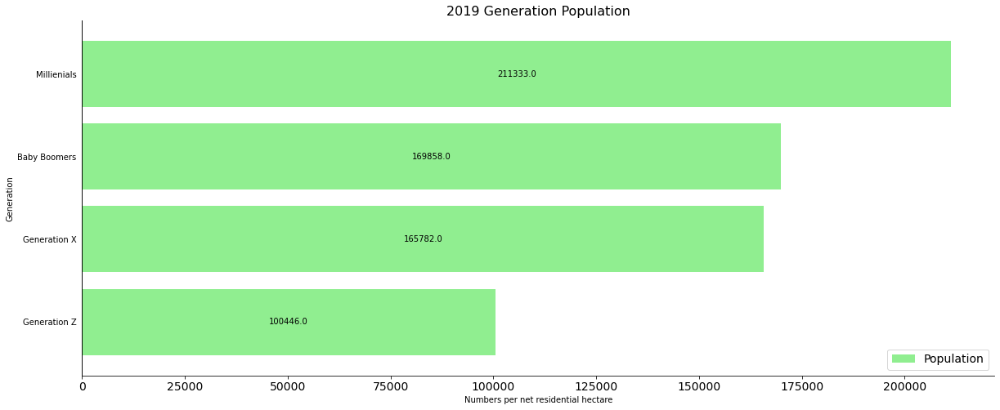

In [307]:
color_list = ['lightgreen'] 

ax = dS2019.plot.barh(stacked=False,figsize = (20, 8), width = 0.8, color = color_list, align='center', edgecolor = None);



ax.set_title("2019 Generation Population", fontsize = 16)#use font size 16 for the title
ax.legend(fontsize='14',facecolor='white')#use font size 14 for legend
ax.tick_params(axis='x', labelsize=14)#use font size 14 for axis-lable
ax.set_xlabel('Numbers per net residential hectare') 
ax.spines['left'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

for p in ax.patches:
    left, bottom, width, height = p.get_bbox().bounds
    ax.annotate(str(width.round(1)), xy=(left+width/2, bottom+height/2), 
                ha='center', va='center')
    
#ax.set_xlim(0, 35)
    
# remove the left, top, and right borders; make sure the color of x axix labels is black
ax.set_facecolor('xkcd:white') # change background to white  #ax.set_facecolor('xkcd:white')
#ax.set_xticklabels([]) # turn off y ticks
ax.tick_params(left=False)
ax.axvline(0, color='black') # draw an x axix line 
ax.tick_params(axis='x', colors='black') # make sure the color of x axix labels is black    

## 2009 Generation

Reference:    
 - https://data.edmonton.ca/Census/2009-Census-Population-By-Single-Year-Of-Age-And-G/qzrg-q4nv 2009 Census - Population By Single Year Of Age And Gender (Neighbourhood)

Import data

In [308]:
d2009 = pd.read_csv("https://data.edmonton.ca/api/views/qzrg-q4nv/rows.csv?accessType=DOWNLOAD")
d2009.tail()

,NEIGHBOURHOOD,AGE,FEMALE,MALE
28009,KINOKAMAU PLAINS AREA,82,0,0
28010,KINOKAMAU PLAINS AREA,83,0,0
28011,KINOKAMAU PLAINS AREA,84,0,0
28012,KINOKAMAU PLAINS AREA,85+,0,0
28013,KINOKAMAU PLAINS AREA,No Response,9,9


In [309]:
bins=np.arange(0, 86, 5)
print(bins)

[ 0  5 10 15 20 25 30 35 40 45 50 55 60 65 70 75 80 85]


In [310]:
labels=[]
for i in range(len(bins)-1):
    labels.append(str(bins[i])+'-'+str(bins[i+1]-1))

print(labels)

['0-4', '5-9', '10-14', '15-19', '20-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74', '75-79', '80-84']


In [311]:
d2009c=d2009.copy()

d2009c=d2009c[d2009c['AGE']!='85+']
d2009c=d2009c[d2009c['AGE']!='No Response']
d2009c['AGE']=pd.to_numeric(d2009c['AGE'])

bins = np.arange(0, 86, 5)
labels=[]
for i in range(len(bins)-1):
    labels.append(str(bins[i])+'-'+str(bins[i+1]-1))
d2009c['Age Range'] = pd.cut(d2009c.AGE, bins, labels = labels,include_lowest = True)
d2009c.rename(columns={'NEIGHBOURHOOD':'Neighbourhood'}, inplace=True)
d2009c['Population']=d2009c['FEMALE']+d2009c['MALE']
d2009c.head()

,Neighbourhood,AGE,FEMALE,MALE,Age Range,Population
0,ABBOTTSFIELD,0,25,18,0-4,43
1,ABBOTTSFIELD,1,24,22,0-4,46
2,ABBOTTSFIELD,2,16,28,0-4,44
3,ABBOTTSFIELD,3,20,21,0-4,41
4,ABBOTTSFIELD,4,19,24,0-4,43


In [312]:
d2009c = d2009c.groupby(['Neighbourhood','Age Range'],axis=0)['Population'].sum().reset_index()
d2009c.head()

,Neighbourhood,Age Range,Population
0,ABBOTTSFIELD,0-4,256
1,ABBOTTSFIELD,5-9,157
2,ABBOTTSFIELD,10-14,126
3,ABBOTTSFIELD,15-19,98
4,ABBOTTSFIELD,20-24,161


In [313]:
d2009c85=d2009.copy()
d2009c85=d2009c85[d2009c85['AGE']=='85+']
d2009c85.rename(columns={'AGE':'Age Range','NEIGHBOURHOOD':'Neighbourhood'}, inplace=True)
d2009c85['Population']=d2009c85['FEMALE']+d2009c85['MALE']
d2009c85.drop(["FEMALE","MALE"],axis=1, inplace=True)
d2009c85.head()

,Neighbourhood,Age Range,Population
85,ABBOTTSFIELD,85+,7
172,ALBERTA AVENUE,85+,81
259,ALBERTA PARK INDUSTRIAL,85+,0
346,ALDERGROVE,85+,27
433,ALLENDALE,85+,45


In [314]:
d2009c = d2009c.append(d2009c85, ignore_index=True)
d2009c['Neighbourhood']=d2009c['Neighbourhood'].str.title()
d2009c.head()

,Neighbourhood,Age Range,Population
0,Abbottsfield,0-4,256
1,Abbottsfield,5-9,157
2,Abbottsfield,10-14,126
3,Abbottsfield,15-19,98
4,Abbottsfield,20-24,161


### Generation Z

In [315]:
dZ2009=d2009c.copy()
dZ2009.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
# Create variable with TRUE if condition:
age1= dZ2009['Age Range'] == "5-9"
age2= dZ2009['Age Range'] == "10-14"
#age3= dZ2019['Age Range'] == "15-19"
#age4= dZ2019['Age Range'] == "20-24"


# Select all cases where nationality is USA and age is greater than 50
dZ2009=dZ2009[age1 | age2]# | age3 | age4]
dZ2009.reset_index(drop=True, inplace=True)
dZ2009.tail()

,Neighbourhood,Age Range,Population
639,Yellowhead Corridor,10-14,0
640,York,5-9,209
641,York,10-14,253
642,Youngstown Industrial,5-9,0
643,Youngstown Industrial,10-14,0


In [316]:
dZ2009 = dZ2009.groupby('Neighbourhood',axis=0)['Population'].sum().reset_index()
dZ2009.rename(columns={'Population':'Generation Z Population'}, inplace=True)
dZ2009.head()

,Neighbourhood,Generation Z Population
0,Abbottsfield,283
1,Alberta Avenue,527
2,Alberta Park Industrial,0
3,Aldergrove,651
4,Allendale,195


In [317]:
dZ2009 = pd.merge(dclassMED,
                dZ2009[['Neighbourhood','Generation Z Population']],
                 on='Neighbourhood')
dZ2009.head()

,Neighbourhood,Classification,Generation Z Population
0,Abbottsfield,4,283
1,Alberta Avenue,4,527
2,Aldergrove,2,651
3,Allendale,4,195
4,Ambleside,1,23


citywise - Total Generation Z population

In [318]:
dZ2009total=dZ2009['Generation Z Population'].sum()
print(dZ2009total)

72969


Developing/established/mature/mature DT/mature core Neighbourhood - Total Generation Z population 

In [319]:
dZ2009nei = dZ2009.groupby('Classification',axis=0)['Generation Z Population'].sum().reset_index()
dZ2009nei

,Classification,Generation Z Population
0,1,12301
1,2,34860
2,4,24463
3,5,1289
4,6,56


### Millienials

In [320]:
dY2009=d2009c.copy()
dY2009.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
# Create variable with TRUE if condition:
age1= dY2009['Age Range'] == "15-19"
age2= dY2009['Age Range'] == "20-24"
age3= dY2009['Age Range'] == "25-29"
#age4= dY2019['Age Range'] == "40-44"


# Select all cases where nationality is USA and age is greater than 50
dY2009=dY2009[age1 | age2 | age3]# | age4]
dY2009.reset_index(drop=True, inplace=True)
dY2009.tail()

,Neighbourhood,Age Range,Population
961,York,20-24,273
962,York,25-29,274
963,Youngstown Industrial,15-19,0
964,Youngstown Industrial,20-24,0
965,Youngstown Industrial,25-29,0


In [321]:
dY2009 = dY2009.groupby('Neighbourhood',axis=0)['Population'].sum().reset_index()
dY2009.rename(columns={'Population':'Millennials Population'}, inplace=True)
dY2009.head()

,Neighbourhood,Millennials Population
0,Abbottsfield,416
1,Alberta Avenue,1195
2,Alberta Park Industrial,0
3,Aldergrove,1307
4,Allendale,946


In [322]:
dY2009 = pd.merge(dclassMED,
                dY2009[['Neighbourhood','Millennials Population']],
                 on='Neighbourhood')
dY2009.head()

,Neighbourhood,Classification,Millennials Population
0,Abbottsfield,4,416
1,Alberta Avenue,4,1195
2,Aldergrove,2,1307
3,Allendale,4,946
4,Ambleside,1,69


citywise - Total Millennials population

In [323]:
dY2009total=dY2009['Millennials Population'].sum()
print(dY2009total)

160549


Developing/established/mature/mature DT/mature core Neighbourhood - Total Millennials population 

In [324]:
dY2009nei = dY2009.groupby('Classification',axis=0)['Millennials Population'].sum().reset_index()
dY2009nei

,Classification,Millennials Population
0,1,22636
1,2,62347
2,4,56307
3,5,15195
4,6,4064


### Generation X

In [325]:
dX2009=d2009c.copy()
dX2009.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
# Create variable with TRUE if condition:
age1= dX2009['Age Range'] == "35-39"
age2= dX2009['Age Range'] == "40-44"
age3= dX2009['Age Range'] == "30-34"

# Select all cases where nationality is USA and age is greater than 50
dX2009=dX2009[age1 | age2 | age3 ]#| age4]
dX2009.reset_index(drop=True, inplace=True)
dX2009.tail()

,Neighbourhood,Age Range,Population
961,York,35-39,245
962,York,40-44,274
963,Youngstown Industrial,30-34,0
964,Youngstown Industrial,35-39,0
965,Youngstown Industrial,40-44,0


In [326]:
dX2009 = dX2009.groupby('Neighbourhood',axis=0)['Population'].sum().reset_index()
dX2009.rename(columns={'Population':'Generation X Population'}, inplace=True)
dX2009.head()

,Neighbourhood,Generation X Population
0,Abbottsfield,349
1,Alberta Avenue,1292
2,Alberta Park Industrial,0
3,Aldergrove,965
4,Allendale,534


In [327]:
dX2009 = pd.merge(dclassMED,
                dX2009[['Neighbourhood','Generation X Population']],
                 on='Neighbourhood')
dX2009.head()

,Neighbourhood,Classification,Generation X Population
0,Abbottsfield,4,349
1,Alberta Avenue,4,1292
2,Aldergrove,2,965
3,Allendale,4,534
4,Ambleside,1,67


citywise - Total Generation X population

In [328]:
dX2009total=dX2009['Generation X Population'].sum()
print(dX2009total)

142713


Developing/established/mature/mature DT/mature core Neighbourhood - Total Generation X population 

In [329]:
dX2009nei = dX2009.groupby('Classification',axis=0)['Generation X Population'].sum().reset_index()
dX2009nei

,Classification,Generation X Population
0,1,24943
1,2,55973
2,4,51347
3,5,8710
4,6,1740


### Baby Boomers

In [330]:
dB2009=d2009c.copy()
dB2009.rename(columns={'Neighbourhood Name':'Neighbourhood'}, inplace=True)
# Create variable with TRUE if condition:
age1= dB2009['Age Range'] == "45-49"
age2= dB2009['Age Range'] == "50-54"
age3= dB2009['Age Range'] == "55-59"
age4= dB2009['Age Range'] == "60-64"


# Select all cases where nationality is USA and age is greater than 50
dB2009=dB2009[age1 | age2 | age3 | age4]
dB2009.reset_index(drop=True, inplace=True)
dB2009.tail()

,Neighbourhood,Age Range,Population
1283,York,60-64,180
1284,Youngstown Industrial,45-49,0
1285,Youngstown Industrial,50-54,0
1286,Youngstown Industrial,55-59,0
1287,Youngstown Industrial,60-64,0


In [331]:
dB2009 = dB2009.groupby('Neighbourhood',axis=0)['Population'].sum().reset_index()
dB2009.rename(columns={'Population':'Baby Boomers Population'}, inplace=True)
dB2009.head()

,Neighbourhood,Baby Boomers Population
0,Abbottsfield,288
1,Alberta Avenue,1477
2,Alberta Park Industrial,0
3,Aldergrove,1373
4,Allendale,525


In [332]:
dB2009 = pd.merge(dclassMED,
                dB2009[['Neighbourhood','Baby Boomers Population']],
                 on='Neighbourhood')
dB2009.head()

,Neighbourhood,Classification,Baby Boomers Population
0,Abbottsfield,4,288
1,Alberta Avenue,4,1477
2,Aldergrove,2,1373
3,Allendale,4,525
4,Ambleside,1,37


citywise - Total Generation Z population

In [333]:
dB2009total=dB2009['Baby Boomers Population'].sum()
print(dB2009total)

161398


Developing/established/mature/mature DT/mature core Neighbourhood - Total Generation Z population 

In [334]:
dB2009nei = dB2009.groupby('Classification',axis=0)['Baby Boomers Population'].sum().reset_index()
dB2009nei

,Classification,Baby Boomers Population
0,1,19396
1,2,70322
2,4,61572
3,5,8746
4,6,1362


In [335]:
dB2019nei.iloc[3][1]+dB2019nei.iloc[4][1]-dB2009nei.iloc[3][1]-dB2009nei.iloc[4][1]

843

## Population Change by Neighbourhood Type

In [336]:
dataPC = {'Generation': ['Baby Boomers','Generation X','Millienials','Generation Z'],
            'Developing Neighbourhood':[dB2019nei.iloc[0][1]-dB2009nei.iloc[0][1],dX2019nei.iloc[0][1]-dX2009nei.iloc[0][1],dY2019nei.iloc[0][1]-dY2009nei.iloc[0][1],dZ2019nei.iloc[0][1]-dZ2009nei.iloc[0][1]],
         'Established Neighbourhood':[dB2019nei.iloc[1][1]-dB2009nei.iloc[1][1],dX2019nei.iloc[1][1]-dX2009nei.iloc[1][1],dY2019nei.iloc[1][1]-dY2009nei.iloc[1][1],dZ2019nei.iloc[1][1]-dZ2009nei.iloc[1][1]],
         'Mature Neighbourhood':[dB2019nei.iloc[2][1]-dB2009nei.iloc[2][1],dX2019nei.iloc[2][1]-dX2009nei.iloc[2][1],dY2019nei.iloc[2][1]-dY2009nei.iloc[2][1],dZ2019nei.iloc[2][1]-dZ2009nei.iloc[2][1]],
         'Core Neighbourhood':[dB2019nei.iloc[3][1]+dB2019nei.iloc[4][1]-dB2009nei.iloc[3][1]-dB2009nei.iloc[4][1],dX2019nei.iloc[3][1]+dX2019nei.iloc[4][1]-dX2009nei.iloc[3][1]-dX2009nei.iloc[4][1],dY2019nei.iloc[3][1]+dY2019nei.iloc[4][1]-dY2009nei.iloc[3][1]-dY2009nei.iloc[4][1],dZ2019nei.iloc[3][1]+dZ2019nei.iloc[4][1]-dZ2009nei.iloc[3][1]-dZ2009nei.iloc[4][1]]
        }

dPC = pd.DataFrame (dataPC, columns = ['Generation','Developing Neighbourhood','Established Neighbourhood','Mature Neighbourhood','Core Neighbourhood'])
dPC

,Generation,Developing Neighbourhood,Established Neighbourhood,Mature Neighbourhood,Core Neighbourhood
0,Baby Boomers,19488,-5667,-6204,843
1,Generation X,34367,-5403,-4837,-1058
2,Millienials,55198,-6461,-377,2424
3,Generation Z,19344,-2045,4091,6087


In [337]:
dPC.set_index('Generation', inplace=True)
dPC

,Developing Neighbourhood,Established Neighbourhood,Mature Neighbourhood,Core Neighbourhood
Generation,,,,
Baby Boomers,19488,-5667,-6204,843
Generation X,34367,-5403,-4837,-1058
Millienials,55198,-6461,-377,2424
Generation Z,19344,-2045,4091,6087


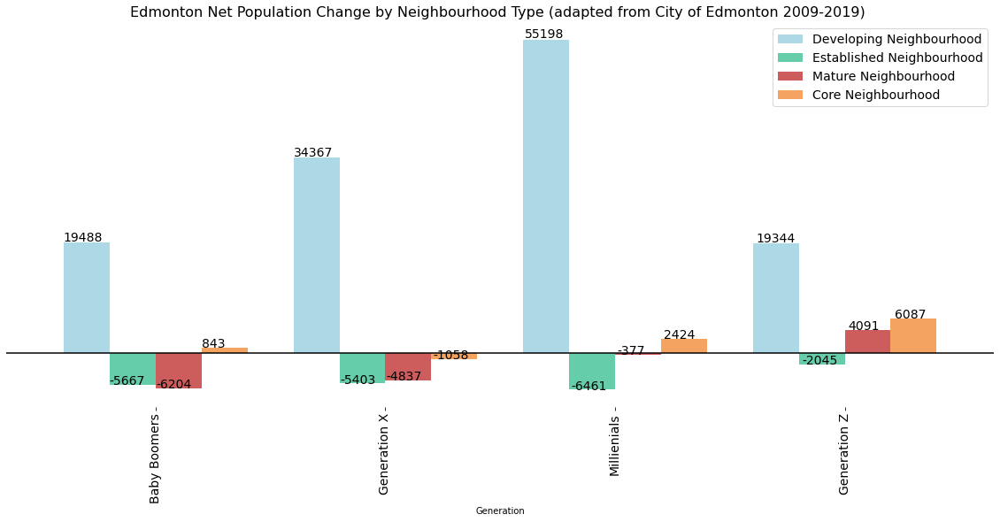

In [338]:
color_list = ['lightblue', 'mediumaquamarine', 'indianred','sandybrown']
ax = dPC.plot(kind = 'bar',figsize = (20, 8), width = 0.8, color = color_list, edgecolor = None)


ax.set_title("Edmonton Net Population Change by Neighbourhood Type (adapted from City of Edmonton 2009-2019) ", fontsize = 16)#use font size 16 for the title
ax.legend(fontsize='14',facecolor='white')#use font size 14 for legend
ax.tick_params(axis='x', labelsize=14)#use font size 14 for axis-lable
#ax.set_xlabel('') 

#Putting the percentage values on top of each bar
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005), fontsize = 14) #use font size 14 for percentages
    
# remove the left, top, and right borders; make sure the color of x axix labels is black
ax.set_facecolor('xkcd:white') # change background to white  #ax.set_facecolor('xkcd:white')
ax.set_yticklabels([]) # turn off y ticks
ax.tick_params(left=False)
ax.axhline(0, color='black') # draw an x axix line 
ax.tick_params(axis='x', colors='black') # make sure the color of x axix labels is black   

ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# END OF PART B